In [ ]:
import numpy as np
import keras as ke
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow import reshape
from tensorflow.keras import Model,backend
from keras.models import Sequential
from matplotlib.pyplot import figure
from sklearn.metrics import mean_squared_error
import gc
import pandas as pd

In [ ]:
p= 100; 
n = 600;
sigma_2 = 0.5;
delta = 0.1;
seed = 100;
epochs = 100;

In [ ]:
train_loss_1 = np.zeros((epochs,seed))
test_loss_1 = np.zeros((epochs,seed))
train_loss_2 = np.zeros((epochs,seed))
test_loss_2 = np.zeros((epochs,seed))
train_loss_3 = np.zeros((epochs,seed))
test_loss_3 = np.zeros((epochs,seed))
train_loss_4 = np.zeros((epochs,seed))
test_loss_4 = np.zeros((epochs,seed))
train_loss_5 = np.zeros((epochs,seed))
test_loss_5 = np.zeros((epochs,seed))
train_loss_6 = np.zeros((epochs,seed))
test_loss_6 = np.zeros((epochs,seed))

In [ ]:
mean_square_error_1 = [];
mean_square_error_2 = [];
mean_square_error_3 = [];
mean_square_error_4 = [];
mean_square_error_5 = [];
mean_square_error_6 = [];

In [ ]:
def create_model_1(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model


In [ ]:
def create_model_2(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_3(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),        
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_4(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),        
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_5(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),  
        tf.keras.layers.Dense(p/2, activation="relu"),        
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_6(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),  
        tf.keras.layers.Dense(p/2, activation="relu"),        
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def simulation_processing(loss_file):

  loss = pd.DataFrame(loss_file)
  loss['min'] = loss.min(axis=1)
  loss['max'] = loss.max(axis=1)
  loss['mean'] = loss.mean(axis=1)
  loss['std'] = loss.std(axis=1)

  return loss

In [ ]:
def plot_seeds(loss):
  plt.figure(figsize=(10, 10))
  plt.plot(loss)
  plt.title('All seeds loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend()
  
  return plt.show()


In [ ]:
for f in range(0,seed):
  A = np.random.rand(p,p)
  B = np.random.rand(p,p)
  n_max_a = np.amax(A)
  n_max_b = np.amax(B)
  phi_0 = A/((1+delta)*n_max_a)
  phi_1 = B/((1+delta)*n_max_b)
  X = np.random.uniform(0,1,p)
  Y = np.random.uniform(0,1,p)
  X_t = np.zeros((n+101,p))

  for i in range(0,n+100):
    sparse_1 = np.random.randint(2,size=p)
    sparse_0 = np.random.randint(2,size=p)
    E_t = np.random.uniform(0,sigma_2,p)
    XX = np.zeros((p,p));
    XX[0,:] = X[:];
    YY = np.zeros((p,p));
    YY[0,:] = Y[:];
    aa = sparse_0*phi_0*XX + sparse_0*phi_1*YY + E_t;
    X_t[i,:] = XX[0,:];   
    X_t[i+1,:] = aa[0,:]/np.max(aa);
    X = X_t[i+1,:];
    Y = X_t[i,:];

  X_tt = X_t[101:,:]
  X_train = X_tt[:499,:]
  y_train = X_tt[1:500,:]
  X_test = X_tt[499:599,:]
  Y_test = X_tt[500:,:]

  model_1 = create_model_1(p)
  history = model_1.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_1[:,f] = history.history['loss']
  test_loss_1[:,f] = history.history['val_loss']

  model_2 = create_model_2(p)
  history = model_2.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_2[:,f] = history.history['loss']
  test_loss_2[:,f] = history.history['val_loss']

  model_3 = create_model_3(p)
  history = model_3.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_3[:,f] = history.history['loss']
  test_loss_3[:,f] = history.history['val_loss']

  model_4 = create_model_4(p)
  history = model_4.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_4[:,f] = history.history['loss']
  test_loss_4[:,f] = history.history['val_loss']

  model_5 = create_model_5(p)
  history = model_5.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_5[:,f] = history.history['loss']
  test_loss_5[:,f] = history.history['val_loss']

  model_6 = create_model_6(p)
  history = model_6.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_6[:,f] = history.history['loss']
  test_loss_6[:,f] = history.history['val_loss']

  mean_square_error_1.append(mean_squared_error(Y_test,model_1.predict(X_test)))
  mean_square_error_2.append(mean_squared_error(Y_test,model_2.predict(X_test)))
  mean_square_error_3.append(mean_squared_error(Y_test,model_3.predict(X_test)))
  mean_square_error_4.append(mean_squared_error(Y_test,model_4.predict(X_test)))
  mean_square_error_5.append(mean_squared_error(Y_test,model_5.predict(X_test)))
  mean_square_error_6.append(mean_squared_error(Y_test,model_6.predict(X_test)))

  del model_1
  del model_2
  del model_3
  del model_4
  del model_5
  del model_6
  del history
  del A
  del n_max_a
  del n_max_b
  del X
  del X_t




Epoch 1/100


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1913 - val_loss: 0.1685 - 943ms/epoch - 59ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1612 - val_loss: 0.1601 - 56ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1576 - val_loss: 0.1591 - 116ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1568 - val_loss: 0.1587 - 68ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1565 - val_loss: 0.1581 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1561 - val_loss: 0.1594 - 75ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1553 - val_loss: 0.1569 - 60ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1531 - val_loss: 0.1553 - 113ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1525 - val_loss: 0.1552 - 173ms/epoch - 11ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1522 - val_loss: 0.1567 - 186ms/epoch - 12ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1522 - val_loss: 0.1555 - 216ms/epoch - 13ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1580 - 166ms/epoch - 10ms/step
Epoch 13/100
16/16 - 0s -

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1930 - val_loss: 0.1635 - 486ms/epoch - 30ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1604 - val_loss: 0.1572 - 44ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1567 - val_loss: 0.1561 - 42ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1555 - val_loss: 0.1572 - 53ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1544 - val_loss: 0.1549 - 46ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1537 - val_loss: 0.1559 - 42ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1535 - val_loss: 0.1550 - 42ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1532 - val_loss: 0.1554 - 39ms/epoch - 2ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1527 - val_loss: 0.1554 - 55ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1530 - val_loss: 0.1561 - 58ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1521 - val_loss: 0.1533 - 70ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1544 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1909 - val_loss: 0.1806 - 365ms/epoch - 23ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1705 - val_loss: 0.1737 - 37ms/epoch - 2ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1673 - val_loss: 0.1705 - 46ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1645 - val_loss: 0.1703 - 45ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1638 - val_loss: 0.1704 - 61ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1637 - val_loss: 0.1706 - 58ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1633 - val_loss: 0.1709 - 46ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1629 - val_loss: 0.1695 - 47ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1600 - val_loss: 0.1659 - 43ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1563 - val_loss: 0.1623 - 41ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1545 - val_loss: 0.1624 - 42ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1528 - val_loss: 0.1586 - 46ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1947 - val_loss: 0.1719 - 372ms/epoch - 23ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1670 - val_loss: 0.1677 - 46ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1631 - val_loss: 0.1642 - 47ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1617 - val_loss: 0.1650 - 47ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1614 - val_loss: 0.1642 - 53ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1618 - val_loss: 0.1637 - 51ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1607 - val_loss: 0.1637 - 62ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1607 - val_loss: 0.1639 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1601 - val_loss: 0.1637 - 49ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1599 - val_loss: 0.1642 - 62ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1587 - val_loss: 0.1628 - 46ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1580 - val_loss: 0.1627 - 54ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1884 - val_loss: 0.1605 - 441ms/epoch - 28ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1535 - val_loss: 0.1538 - 55ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1535 - 69ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1542 - 57ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1479 - val_loss: 0.1532 - 49ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1476 - val_loss: 0.1532 - 46ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1472 - val_loss: 0.1531 - 58ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1465 - val_loss: 0.1538 - 44ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1465 - val_loss: 0.1537 - 49ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1469 - val_loss: 0.1549 - 48ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1466 - val_loss: 0.1540 - 46ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1458 - val_loss: 0.1541 - 43ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1874 - val_loss: 0.1683 - 403ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1541 - val_loss: 0.1586 - 45ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1576 - 52ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1494 - val_loss: 0.1578 - 49ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1577 - 36ms/epoch - 2ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1566 - 44ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1480 - val_loss: 0.1562 - 47ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1566 - 44ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1476 - val_loss: 0.1584 - 73ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1568 - 43ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1474 - val_loss: 0.1571 - 48ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1459 - val_loss: 0.1569 - 49ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1929 - val_loss: 0.1753 - 432ms/epoch - 27ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1669 - val_loss: 0.1688 - 74ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1626 - val_loss: 0.1668 - 48ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1605 - val_loss: 0.1638 - 45ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1595 - val_loss: 0.1642 - 49ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1592 - val_loss: 0.1641 - 55ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1587 - val_loss: 0.1638 - 43ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1587 - val_loss: 0.1632 - 39ms/epoch - 2ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1573 - val_loss: 0.1625 - 48ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1566 - val_loss: 0.1629 - 52ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1563 - val_loss: 0.1639 - 54ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1566 - val_loss: 0.1630 - 62ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1780 - val_loss: 0.1546 - 385ms/epoch - 24ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1476 - val_loss: 0.1485 - 46ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1449 - val_loss: 0.1479 - 50ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1439 - val_loss: 0.1476 - 47ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1435 - val_loss: 0.1472 - 44ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1432 - val_loss: 0.1474 - 45ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1427 - val_loss: 0.1470 - 66ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1422 - val_loss: 0.1482 - 48ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1421 - val_loss: 0.1479 - 60ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1416 - val_loss: 0.1482 - 54ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1420 - val_loss: 0.1497 - 59ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1416 - val_loss: 0.1485 - 50ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1879 - val_loss: 0.1662 - 392ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1635 - val_loss: 0.1588 - 49ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1592 - val_loss: 0.1576 - 47ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1582 - val_loss: 0.1573 - 47ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1576 - val_loss: 0.1570 - 46ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1571 - val_loss: 0.1572 - 46ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1572 - val_loss: 0.1580 - 54ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1566 - val_loss: 0.1570 - 64ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1563 - val_loss: 0.1573 - 42ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1552 - val_loss: 0.1560 - 43ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1549 - val_loss: 0.1558 - 46ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1541 - val_loss: 0.1542 - 44ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1807 - val_loss: 0.1597 - 404ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1502 - val_loss: 0.1558 - 48ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1483 - val_loss: 0.1548 - 67ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1477 - val_loss: 0.1546 - 51ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1471 - val_loss: 0.1541 - 47ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1466 - val_loss: 0.1545 - 73ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1460 - val_loss: 0.1547 - 46ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1459 - val_loss: 0.1543 - 50ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1444 - val_loss: 0.1538 - 50ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1436 - val_loss: 0.1538 - 51ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1433 - val_loss: 0.1535 - 45ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1436 - val_loss: 0.1533 - 62ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1904 - val_loss: 0.1655 - 376ms/epoch - 24ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1578 - val_loss: 0.1556 - 50ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1532 - val_loss: 0.1533 - 69ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1520 - val_loss: 0.1529 - 59ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1515 - val_loss: 0.1528 - 55ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1507 - val_loss: 0.1513 - 51ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1536 - 72ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1495 - val_loss: 0.1526 - 64ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1512 - 48ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1484 - val_loss: 0.1519 - 46ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1485 - val_loss: 0.1529 - 79ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1489 - val_loss: 0.1520 - 63ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
16/16 - 0s - loss: 0.1979 - val_loss: 0.1740 - 368ms/epoch - 23ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1671 - val_loss: 0.1696 - 66ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1634 - val_loss: 0.1660 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1612 - val_loss: 0.1657 - 45ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1611 - val_loss: 0.1656 - 46ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1607 - val_loss: 0.1654 - 57ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1605 - val_loss: 0.1662 - 51ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1603 - val_loss: 0.1663 - 49ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1600 - val_loss: 0.1663 - 49ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1594 - val_loss: 0.1668 - 68ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1598 - val_loss: 0.1653 - 76ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1576 - val_loss: 0.1628 - 53ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1822 - val_loss: 0.1576 - 429ms/epoch - 27ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1506 - val_loss: 0.1536 - 69ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1518 - 55ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1471 - val_loss: 0.1517 - 55ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1465 - val_loss: 0.1530 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1459 - val_loss: 0.1517 - 59ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1455 - val_loss: 0.1513 - 70ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1452 - val_loss: 0.1500 - 63ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1430 - val_loss: 0.1497 - 57ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1426 - val_loss: 0.1498 - 72ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1428 - val_loss: 0.1509 - 58ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1423 - val_loss: 0.1514 - 57ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1829 - val_loss: 0.1578 - 435ms/epoch - 27ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1544 - val_loss: 0.1532 - 57ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1513 - val_loss: 0.1524 - 51ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1505 - val_loss: 0.1520 - 57ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1496 - val_loss: 0.1509 - 64ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1514 - 57ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1511 - 53ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1485 - val_loss: 0.1517 - 48ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1480 - val_loss: 0.1514 - 53ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1480 - val_loss: 0.1519 - 47ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1474 - val_loss: 0.1501 - 48ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1460 - val_loss: 0.1503 - 49ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1875 - val_loss: 0.1551 - 426ms/epoch - 27ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1466 - 55ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1443 - val_loss: 0.1464 - 49ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1430 - val_loss: 0.1453 - 51ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1425 - val_loss: 0.1451 - 53ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1420 - val_loss: 0.1450 - 55ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1418 - val_loss: 0.1449 - 55ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1414 - val_loss: 0.1452 - 65ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1415 - val_loss: 0.1467 - 59ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1411 - val_loss: 0.1455 - 53ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1404 - val_loss: 0.1449 - 49ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1406 - val_loss: 0.1459 - 49ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1833 - val_loss: 0.1559 - 377ms/epoch - 24ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1570 - val_loss: 0.1513 - 53ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1544 - val_loss: 0.1505 - 50ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1534 - val_loss: 0.1500 - 43ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1527 - val_loss: 0.1500 - 47ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1524 - val_loss: 0.1501 - 51ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1520 - val_loss: 0.1506 - 50ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1518 - val_loss: 0.1504 - 51ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1505 - 43ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1513 - val_loss: 0.1516 - 47ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1515 - 48ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1467 - 56ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1880 - val_loss: 0.1537 - 469ms/epoch - 29ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1609 - val_loss: 0.1477 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1580 - val_loss: 0.1469 - 64ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1573 - val_loss: 0.1468 - 51ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1566 - val_loss: 0.1477 - 48ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1562 - val_loss: 0.1479 - 61ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1567 - val_loss: 0.1485 - 61ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1561 - val_loss: 0.1483 - 51ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1558 - val_loss: 0.1471 - 50ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1553 - val_loss: 0.1479 - 45ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1554 - val_loss: 0.1475 - 48ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1546 - val_loss: 0.1479 - 45ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1891 - val_loss: 0.1568 - 399ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1558 - val_loss: 0.1501 - 70ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1501 - 51ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1510 - val_loss: 0.1496 - 88ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1493 - 52ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1496 - val_loss: 0.1498 - 69ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1497 - val_loss: 0.1495 - 56ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1489 - val_loss: 0.1496 - 54ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1504 - 70ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1501 - 57ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1483 - val_loss: 0.1503 - 56ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1480 - val_loss: 0.1511 - 65ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.2061 - val_loss: 0.1820 - 423ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1793 - val_loss: 0.1730 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1752 - val_loss: 0.1729 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1744 - val_loss: 0.1716 - 61ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1736 - val_loss: 0.1714 - 56ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1736 - val_loss: 0.1710 - 59ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1733 - val_loss: 0.1716 - 55ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1728 - val_loss: 0.1715 - 73ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1729 - val_loss: 0.1718 - 69ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1722 - val_loss: 0.1698 - 76ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1703 - val_loss: 0.1703 - 65ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1677 - val_loss: 0.1656 - 57ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.2020 - val_loss: 0.1783 - 381ms/epoch - 24ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1669 - val_loss: 0.1694 - 60ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1622 - val_loss: 0.1675 - 56ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1612 - val_loss: 0.1669 - 53ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1608 - val_loss: 0.1671 - 59ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1605 - val_loss: 0.1667 - 61ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1604 - val_loss: 0.1662 - 77ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1602 - val_loss: 0.1683 - 78ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1595 - val_loss: 0.1657 - 61ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1585 - val_loss: 0.1651 - 72ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1580 - val_loss: 0.1680 - 76ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1588 - val_loss: 0.1665 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1916 - val_loss: 0.1684 - 383ms/epoch - 24ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1632 - val_loss: 0.1645 - 51ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1592 - val_loss: 0.1626 - 55ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1579 - val_loss: 0.1613 - 70ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1572 - val_loss: 0.1622 - 54ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1571 - val_loss: 0.1616 - 61ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1566 - val_loss: 0.1618 - 65ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1565 - val_loss: 0.1618 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1559 - val_loss: 0.1623 - 71ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1562 - val_loss: 0.1605 - 68ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1539 - val_loss: 0.1586 - 68ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1525 - val_loss: 0.1589 - 56ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1868 - val_loss: 0.1640 - 446ms/epoch - 28ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1570 - val_loss: 0.1559 - 59ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1544 - val_loss: 0.1570 - 64ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1536 - val_loss: 0.1539 - 76ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1525 - val_loss: 0.1541 - 108ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1545 - 79ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1558 - 62ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1514 - val_loss: 0.1544 - 74ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1520 - val_loss: 0.1549 - 77ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1563 - 49ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1532 - 54ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1547 - 79ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.2004 - val_loss: 0.1669 - 386ms/epoch - 24ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1631 - val_loss: 0.1592 - 62ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1587 - val_loss: 0.1582 - 58ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1577 - val_loss: 0.1580 - 52ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1570 - val_loss: 0.1576 - 62ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1566 - val_loss: 0.1583 - 70ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1561 - val_loss: 0.1578 - 79ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1559 - val_loss: 0.1582 - 64ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1555 - val_loss: 0.1577 - 62ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1555 - val_loss: 0.1584 - 68ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1552 - val_loss: 0.1584 - 78ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1552 - val_loss: 0.1587 - 58ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1779 - val_loss: 0.1452 - 415ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1419 - 73ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1462 - val_loss: 0.1406 - 59ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1457 - val_loss: 0.1394 - 67ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1448 - val_loss: 0.1397 - 60ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1447 - val_loss: 0.1391 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1447 - val_loss: 0.1394 - 60ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1441 - val_loss: 0.1390 - 50ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1443 - val_loss: 0.1389 - 54ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1442 - val_loss: 0.1388 - 59ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1434 - val_loss: 0.1399 - 62ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1436 - val_loss: 0.1399 - 65ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1831 - val_loss: 0.1551 - 445ms/epoch - 28ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1520 - val_loss: 0.1491 - 68ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1489 - val_loss: 0.1486 - 70ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1477 - val_loss: 0.1488 - 54ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1490 - 55ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1471 - val_loss: 0.1492 - 54ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1470 - val_loss: 0.1495 - 56ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1468 - val_loss: 0.1492 - 73ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1455 - val_loss: 0.1480 - 69ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1449 - val_loss: 0.1485 - 63ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1446 - val_loss: 0.1482 - 53ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1441 - val_loss: 0.1480 - 59ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1875 - val_loss: 0.1683 - 435ms/epoch - 27ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1601 - val_loss: 0.1564 - 67ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1552 - val_loss: 0.1557 - 73ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1540 - val_loss: 0.1561 - 56ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1537 - val_loss: 0.1557 - 68ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1531 - val_loss: 0.1560 - 62ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1527 - val_loss: 0.1563 - 59ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1523 - val_loss: 0.1562 - 88ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1518 - val_loss: 0.1565 - 66ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1516 - val_loss: 0.1570 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1514 - val_loss: 0.1564 - 65ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1512 - val_loss: 0.1574 - 63ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1857 - val_loss: 0.1552 - 427ms/epoch - 27ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1467 - 57ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1446 - val_loss: 0.1468 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1440 - val_loss: 0.1459 - 75ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1431 - val_loss: 0.1461 - 74ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1430 - val_loss: 0.1467 - 53ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1428 - val_loss: 0.1465 - 79ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1427 - val_loss: 0.1466 - 56ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1424 - val_loss: 0.1466 - 57ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1419 - val_loss: 0.1454 - 54ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1408 - val_loss: 0.1452 - 70ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1405 - val_loss: 0.1455 - 58ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1925 - val_loss: 0.1611 - 412ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1585 - val_loss: 0.1563 - 62ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1557 - val_loss: 0.1547 - 56ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1549 - val_loss: 0.1546 - 57ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1546 - val_loss: 0.1550 - 60ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1541 - val_loss: 0.1542 - 59ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1537 - val_loss: 0.1536 - 65ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1532 - val_loss: 0.1539 - 62ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1534 - val_loss: 0.1550 - 72ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1533 - val_loss: 0.1542 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1529 - val_loss: 0.1541 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1523 - val_loss: 0.1553 - 54ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1817 - val_loss: 0.1524 - 445ms/epoch - 28ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1544 - val_loss: 0.1475 - 60ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1510 - val_loss: 0.1473 - 62ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1473 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1466 - 74ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1479 - 65ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1474 - 66ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1483 - val_loss: 0.1474 - 56ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1480 - val_loss: 0.1479 - 62ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1473 - 77ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1476 - val_loss: 0.1471 - 72ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1453 - val_loss: 0.1445 - 65ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1908 - val_loss: 0.1637 - 421ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1584 - val_loss: 0.1573 - 72ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1525 - val_loss: 0.1539 - 61ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1531 - 62ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1507 - val_loss: 0.1534 - 71ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1505 - val_loss: 0.1535 - 72ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1530 - 57ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1485 - val_loss: 0.1528 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1472 - val_loss: 0.1500 - 70ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1461 - val_loss: 0.1502 - 56ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1453 - val_loss: 0.1487 - 74ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1437 - val_loss: 0.1482 - 70ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1827 - val_loss: 0.1589 - 430ms/epoch - 27ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1522 - val_loss: 0.1506 - 77ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1476 - val_loss: 0.1494 - 100ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1463 - val_loss: 0.1491 - 131ms/epoch - 8ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1456 - val_loss: 0.1490 - 58ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1448 - val_loss: 0.1481 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1433 - val_loss: 0.1480 - 89ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1428 - val_loss: 0.1468 - 73ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1413 - val_loss: 0.1470 - 70ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1407 - val_loss: 0.1471 - 70ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1407 - val_loss: 0.1475 - 61ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1406 - val_loss: 0.1472 - 78ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1914 - val_loss: 0.1589 - 449ms/epoch - 28ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1571 - val_loss: 0.1547 - 73ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1539 - val_loss: 0.1529 - 75ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1518 - 63ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1514 - 60ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1510 - 83ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1498 - val_loss: 0.1517 - 65ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1494 - val_loss: 0.1530 - 69ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1494 - val_loss: 0.1531 - 63ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1495 - val_loss: 0.1523 - 68ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1514 - 65ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1479 - val_loss: 0.1509 - 90ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1937 - val_loss: 0.1722 - 1s/epoch - 71ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1657 - val_loss: 0.1659 - 60ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1630 - val_loss: 0.1651 - 73ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1617 - val_loss: 0.1650 - 97ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1606 - val_loss: 0.1638 - 90ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1595 - val_loss: 0.1628 - 86ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1586 - val_loss: 0.1619 - 96ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1580 - val_loss: 0.1624 - 69ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1566 - val_loss: 0.1613 - 91ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1559 - val_loss: 0.1617 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1555 - val_loss: 0.1616 - 72ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1551 - val_loss: 0.1617 - 70ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1552

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1941 - val_loss: 0.1538 - 398ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1588 - val_loss: 0.1492 - 84ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1557 - val_loss: 0.1491 - 67ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1552 - val_loss: 0.1481 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1542 - val_loss: 0.1479 - 62ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1540 - val_loss: 0.1479 - 77ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1537 - val_loss: 0.1478 - 73ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1532 - val_loss: 0.1483 - 69ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1486 - 78ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1512 - val_loss: 0.1475 - 56ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1463 - 48ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1499 - val_loss: 0.1457 - 72ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1916 - val_loss: 0.1605 - 408ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1582 - val_loss: 0.1545 - 56ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1532 - val_loss: 0.1519 - 51ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1515 - val_loss: 0.1515 - 58ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1514 - 60ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1491 - val_loss: 0.1506 - 53ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1493 - val_loss: 0.1506 - 51ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1489 - val_loss: 0.1504 - 71ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1482 - val_loss: 0.1504 - 77ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1470 - val_loss: 0.1491 - 66ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1461 - val_loss: 0.1501 - 50ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1463 - val_loss: 0.1494 - 56ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.2010 - val_loss: 0.1740 - 408ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1652 - val_loss: 0.1668 - 62ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1604 - val_loss: 0.1631 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1574 - val_loss: 0.1623 - 80ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1553 - val_loss: 0.1598 - 77ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1540 - val_loss: 0.1600 - 57ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1535 - val_loss: 0.1601 - 51ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1536 - val_loss: 0.1603 - 71ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1530 - val_loss: 0.1607 - 55ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1528 - val_loss: 0.1602 - 74ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1530 - val_loss: 0.1612 - 63ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1525 - val_loss: 0.1611 - 76ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1886 - val_loss: 0.1592 - 404ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1596 - val_loss: 0.1567 - 80ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1559 - val_loss: 0.1530 - 68ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1545 - val_loss: 0.1528 - 83ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1541 - val_loss: 0.1532 - 97ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1536 - val_loss: 0.1523 - 83ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1516 - val_loss: 0.1509 - 55ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1510 - val_loss: 0.1509 - 75ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1504 - val_loss: 0.1506 - 69ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1508 - 61ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1496 - val_loss: 0.1508 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1494 - val_loss: 0.1509 - 63ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1957 - val_loss: 0.1614 - 395ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1641 - val_loss: 0.1572 - 56ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1615 - val_loss: 0.1549 - 71ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1597 - val_loss: 0.1547 - 59ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1590 - val_loss: 0.1548 - 62ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1579 - val_loss: 0.1538 - 53ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1571 - val_loss: 0.1550 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1567 - val_loss: 0.1538 - 64ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1568 - val_loss: 0.1542 - 72ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1567 - val_loss: 0.1540 - 68ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1562 - val_loss: 0.1538 - 70ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1560 - val_loss: 0.1542 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1880 - val_loss: 0.1634 - 449ms/epoch - 28ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1583 - val_loss: 0.1602 - 77ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1557 - val_loss: 0.1603 - 98ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1553 - val_loss: 0.1583 - 60ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1543 - val_loss: 0.1588 - 88ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1545 - val_loss: 0.1604 - 80ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1545 - val_loss: 0.1589 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1539 - val_loss: 0.1590 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1533 - val_loss: 0.1586 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1522 - val_loss: 0.1577 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1507 - val_loss: 0.1586 - 80ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1578 - 70ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1831 - val_loss: 0.1525 - 868ms/epoch - 54ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1571 - val_loss: 0.1455 - 59ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1417 - 75ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1517 - val_loss: 0.1452 - 57ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1512 - val_loss: 0.1420 - 75ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1496 - val_loss: 0.1410 - 62ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1415 - 55ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1487 - val_loss: 0.1420 - 77ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1483 - val_loss: 0.1414 - 77ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1416 - 78ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1476 - val_loss: 0.1418 - 60ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1466 - val_loss: 0.1421 - 71ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.2032 - val_loss: 0.1663 - 506ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1656 - val_loss: 0.1572 - 109ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1600 - val_loss: 0.1551 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1585 - val_loss: 0.1562 - 64ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1576 - val_loss: 0.1534 - 69ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1542 - val_loss: 0.1512 - 71ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1533 - val_loss: 0.1535 - 71ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1529 - val_loss: 0.1522 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1526 - val_loss: 0.1525 - 75ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1521 - val_loss: 0.1545 - 90ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1524 - val_loss: 0.1548 - 108ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1521 - val_loss: 0.1514 - 99ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1903 - val_loss: 0.1564 - 413ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1540 - val_loss: 0.1514 - 67ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1516 - val_loss: 0.1502 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1515 - 72ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1498 - val_loss: 0.1502 - 77ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1506 - val_loss: 0.1506 - 76ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1496 - val_loss: 0.1500 - 73ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1489 - val_loss: 0.1500 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1501 - 79ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1480 - val_loss: 0.1487 - 71ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1469 - val_loss: 0.1490 - 62ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1466 - val_loss: 0.1489 - 58ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1965 - val_loss: 0.1618 - 440ms/epoch - 28ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1631 - val_loss: 0.1551 - 62ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1594 - val_loss: 0.1540 - 73ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1576 - val_loss: 0.1526 - 67ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1569 - val_loss: 0.1521 - 71ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1557 - val_loss: 0.1508 - 77ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1553 - val_loss: 0.1520 - 71ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1545 - val_loss: 0.1508 - 67ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1538 - val_loss: 0.1515 - 77ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1534 - val_loss: 0.1510 - 52ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1523 - val_loss: 0.1496 - 50ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1512 - val_loss: 0.1497 - 60ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1853 - val_loss: 0.1651 - 453ms/epoch - 28ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1557 - val_loss: 0.1583 - 66ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1528 - val_loss: 0.1567 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1520 - val_loss: 0.1567 - 73ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1518 - val_loss: 0.1569 - 81ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1514 - val_loss: 0.1567 - 85ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1568 - 66ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1512 - val_loss: 0.1566 - 87ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1572 - 60ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1502 - val_loss: 0.1574 - 72ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1574 - 56ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1504 - val_loss: 0.1570 - 69ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1896 - val_loss: 0.1570 - 382ms/epoch - 24ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1558 - val_loss: 0.1515 - 72ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1530 - val_loss: 0.1511 - 62ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1517 - val_loss: 0.1516 - 50ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1515 - 61ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1516 - 60ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1506 - val_loss: 0.1515 - 71ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1510 - val_loss: 0.1530 - 57ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1505 - val_loss: 0.1513 - 67ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1498 - val_loss: 0.1514 - 50ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1493 - val_loss: 0.1512 - 49ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1493 - val_loss: 0.1516 - 51ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1853 - val_loss: 0.1726 - 415ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1562 - val_loss: 0.1641 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1521 - val_loss: 0.1624 - 95ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1620 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1621 - 101ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1504 - val_loss: 0.1637 - 63ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1502 - val_loss: 0.1627 - 59ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1494 - val_loss: 0.1598 - 74ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1482 - val_loss: 0.1604 - 55ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1617 - 55ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1463 - val_loss: 0.1577 - 53ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1441 - val_loss: 0.1569 - 84ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1940 - val_loss: 0.1652 - 437ms/epoch - 27ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1598 - val_loss: 0.1585 - 77ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1561 - val_loss: 0.1570 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1545 - val_loss: 0.1554 - 63ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1537 - val_loss: 0.1567 - 77ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1543 - val_loss: 0.1561 - 68ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1545 - val_loss: 0.1571 - 72ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1534 - val_loss: 0.1556 - 73ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1527 - val_loss: 0.1561 - 67ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1520 - val_loss: 0.1578 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1521 - val_loss: 0.1553 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1504 - val_loss: 0.1528 - 76ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1820 - val_loss: 0.1579 - 494ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1549 - val_loss: 0.1535 - 100ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1513 - val_loss: 0.1506 - 75ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1497 - 77ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1507 - 66ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1493 - val_loss: 0.1499 - 70ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1494 - val_loss: 0.1499 - 70ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1489 - val_loss: 0.1493 - 67ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1469 - val_loss: 0.1496 - 49ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1463 - val_loss: 0.1484 - 51ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1465 - val_loss: 0.1487 - 51ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1455 - val_loss: 0.1481 - 49ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1825 - val_loss: 0.1623 - 493ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1588 - 70ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1466 - val_loss: 0.1562 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1458 - val_loss: 0.1562 - 96ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1454 - val_loss: 0.1560 - 69ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1450 - val_loss: 0.1563 - 63ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1452 - val_loss: 0.1561 - 75ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1446 - val_loss: 0.1582 - 62ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1454 - val_loss: 0.1556 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1443 - val_loss: 0.1563 - 134ms/epoch - 8ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1437 - val_loss: 0.1562 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1428 - val_loss: 0.1545 - 57ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1933 - val_loss: 0.1619 - 394ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1600 - val_loss: 0.1534 - 71ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1544 - val_loss: 0.1507 - 68ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1524 - val_loss: 0.1507 - 55ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1517 - val_loss: 0.1505 - 55ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1503 - 56ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1512 - val_loss: 0.1506 - 71ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1499 - val_loss: 0.1510 - 73ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1499 - 53ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1487 - val_loss: 0.1501 - 54ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1484 - val_loss: 0.1500 - 69ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1481 - val_loss: 0.1511 - 59ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1846 - val_loss: 0.1603 - 424ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1559 - val_loss: 0.1537 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1513 - val_loss: 0.1527 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1524 - 56ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1494 - val_loss: 0.1504 - 60ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1483 - val_loss: 0.1497 - 51ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1484 - val_loss: 0.1501 - 55ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1487 - val_loss: 0.1500 - 62ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1479 - val_loss: 0.1499 - 77ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1498 - 56ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1493 - 78ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1474 - val_loss: 0.1502 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1821 - val_loss: 0.1601 - 394ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1538 - val_loss: 0.1550 - 57ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1517 - val_loss: 0.1543 - 75ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1534 - 56ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1548 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1497 - val_loss: 0.1543 - 77ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1489 - val_loss: 0.1548 - 61ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1551 - 76ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1485 - val_loss: 0.1551 - 67ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1487 - val_loss: 0.1530 - 53ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1477 - val_loss: 0.1534 - 66ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1464 - val_loss: 0.1530 - 72ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1821 - val_loss: 0.1575 - 433ms/epoch - 27ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1517 - val_loss: 0.1507 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1480 - val_loss: 0.1492 - 64ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1462 - val_loss: 0.1491 - 60ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1463 - val_loss: 0.1498 - 59ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1457 - val_loss: 0.1488 - 65ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1449 - val_loss: 0.1501 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1445 - val_loss: 0.1491 - 74ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1443 - val_loss: 0.1500 - 80ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1439 - val_loss: 0.1497 - 134ms/epoch - 8ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1437 - val_loss: 0.1501 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1431 - val_loss: 0.1512 - 89ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1801 - val_loss: 0.1727 - 411ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1591 - val_loss: 0.1632 - 80ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1548 - val_loss: 0.1610 - 71ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1540 - val_loss: 0.1614 - 74ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1540 - val_loss: 0.1610 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1530 - val_loss: 0.1603 - 70ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1539 - val_loss: 0.1617 - 53ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1538 - val_loss: 0.1607 - 52ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1531 - val_loss: 0.1604 - 55ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1527 - val_loss: 0.1606 - 53ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1524 - val_loss: 0.1617 - 56ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1523 - val_loss: 0.1598 - 61ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1829 - val_loss: 0.1473 - 423ms/epoch - 26ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1417 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1467 - val_loss: 0.1409 - 55ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1461 - val_loss: 0.1407 - 72ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1450 - val_loss: 0.1414 - 70ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1448 - val_loss: 0.1403 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1443 - val_loss: 0.1410 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1451 - val_loss: 0.1408 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1433 - val_loss: 0.1398 - 62ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1427 - val_loss: 0.1392 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1431 - val_loss: 0.1393 - 63ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1422 - val_loss: 0.1396 - 60ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1846 - val_loss: 0.1576 - 404ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1546 - val_loss: 0.1510 - 56ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1499 - val_loss: 0.1493 - 86ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1484 - 60ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1481 - val_loss: 0.1478 - 63ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1480 - val_loss: 0.1481 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1475 - val_loss: 0.1476 - 61ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1476 - 54ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1476 - val_loss: 0.1466 - 57ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1459 - val_loss: 0.1472 - 55ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1451 - val_loss: 0.1468 - 71ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1448 - val_loss: 0.1456 - 84ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.2025 - val_loss: 0.1759 - 395ms/epoch - 25ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1725 - val_loss: 0.1707 - 73ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1697 - val_loss: 0.1696 - 65ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1689 - val_loss: 0.1692 - 59ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1688 - val_loss: 0.1693 - 68ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1686 - val_loss: 0.1689 - 59ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1681 - val_loss: 0.1696 - 53ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1676 - val_loss: 0.1694 - 57ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1668 - val_loss: 0.1685 - 54ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1660 - val_loss: 0.1687 - 56ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1659 - val_loss: 0.1681 - 53ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1648 - val_loss: 0.1669 - 69ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1820 - val_loss: 0.1605 - 471ms/epoch - 29ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1520 - val_loss: 0.1555 - 105ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1530 - 113ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1483 - val_loss: 0.1528 - 67ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1475 - val_loss: 0.1531 - 70ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1475 - val_loss: 0.1530 - 57ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1472 - val_loss: 0.1531 - 70ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1474 - val_loss: 0.1534 - 58ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1468 - val_loss: 0.1537 - 67ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1465 - val_loss: 0.1532 - 78ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1458 - val_loss: 0.1519 - 60ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1449 - val_loss: 0.1520 - 78ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1885 - val_loss: 0.1559 - 532ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1514 - val_loss: 0.1499 - 53ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1477 - val_loss: 0.1482 - 72ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1465 - val_loss: 0.1481 - 97ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1463 - val_loss: 0.1488 - 92ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1459 - val_loss: 0.1502 - 58ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1456 - val_loss: 0.1474 - 54ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1454 - val_loss: 0.1474 - 58ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1450 - val_loss: 0.1477 - 57ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1442 - val_loss: 0.1473 - 53ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1441 - val_loss: 0.1484 - 67ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1440 - val_loss: 0.1478 - 61ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1847 - val_loss: 0.1593 - 465ms/epoch - 29ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1568 - val_loss: 0.1547 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1534 - val_loss: 0.1543 - 68ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1525 - val_loss: 0.1547 - 51ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1520 - val_loss: 0.1550 - 50ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1520 - val_loss: 0.1544 - 48ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1515 - val_loss: 0.1552 - 49ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1514 - val_loss: 0.1547 - 50ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1511 - val_loss: 0.1547 - 53ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1505 - val_loss: 0.1557 - 71ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1504 - val_loss: 0.1549 - 53ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1558 - 52ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1974 - val_loss: 0.1706 - 444ms/epoch - 28ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1718 - val_loss: 0.1660 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1688 - val_loss: 0.1642 - 55ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1672 - val_loss: 0.1637 - 66ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1669 - val_loss: 0.1641 - 75ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1669 - val_loss: 0.1644 - 75ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1662 - val_loss: 0.1641 - 54ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1648 - val_loss: 0.1626 - 65ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1641 - val_loss: 0.1630 - 65ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1630 - val_loss: 0.1620 - 78ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1623 - val_loss: 0.1625 - 76ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1617 - val_loss: 0.1601 - 57ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1871 - val_loss: 0.1535 - 640ms/epoch - 40ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1566 - val_loss: 0.1497 - 67ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1542 - val_loss: 0.1490 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1532 - val_loss: 0.1493 - 54ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1525 - val_loss: 0.1478 - 54ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1516 - val_loss: 0.1476 - 52ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1511 - val_loss: 0.1478 - 55ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1511 - val_loss: 0.1480 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1466 - 52ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1493 - val_loss: 0.1477 - 60ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1482 - val_loss: 0.1456 - 55ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1475 - val_loss: 0.1465 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1952 - val_loss: 0.1724 - 490ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1694 - val_loss: 0.1687 - 48ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1673 - val_loss: 0.1670 - 49ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1659 - val_loss: 0.1660 - 49ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1658 - val_loss: 0.1660 - 48ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1657 - val_loss: 0.1664 - 73ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1648 - val_loss: 0.1661 - 56ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1647 - val_loss: 0.1662 - 76ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1646 - val_loss: 0.1668 - 66ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1642 - val_loss: 0.1678 - 72ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1632 - val_loss: 0.1647 - 91ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1611 - val_loss: 0.1620 - 105ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1924 - val_loss: 0.1611 - 499ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1545 - val_loss: 0.1534 - 80ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1506 - val_loss: 0.1523 - 50ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1497 - val_loss: 0.1519 - 48ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1498 - val_loss: 0.1513 - 63ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1516 - 85ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1482 - val_loss: 0.1512 - 62ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1479 - val_loss: 0.1515 - 66ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1475 - val_loss: 0.1518 - 55ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1472 - val_loss: 0.1519 - 57ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1470 - val_loss: 0.1520 - 55ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1467 - val_loss: 0.1551 - 55ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1782 - val_loss: 0.1506 - 525ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1515 - val_loss: 0.1466 - 49ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1445 - 57ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1466 - val_loss: 0.1440 - 79ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1457 - val_loss: 0.1446 - 74ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1458 - val_loss: 0.1451 - 66ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1452 - val_loss: 0.1446 - 78ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1447 - val_loss: 0.1446 - 57ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1446 - val_loss: 0.1444 - 52ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1438 - val_loss: 0.1450 - 51ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1435 - val_loss: 0.1451 - 76ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1433 - val_loss: 0.1464 - 69ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1901 - val_loss: 0.1548 - 580ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1574 - val_loss: 0.1497 - 50ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1529 - val_loss: 0.1481 - 51ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1511 - val_loss: 0.1469 - 56ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1505 - val_loss: 0.1465 - 53ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1469 - 72ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1495 - val_loss: 0.1468 - 53ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1493 - val_loss: 0.1498 - 72ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1484 - 75ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1493 - val_loss: 0.1473 - 62ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1491 - val_loss: 0.1491 - 76ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1484 - val_loss: 0.1474 - 53ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1869 - val_loss: 0.1659 - 631ms/epoch - 39ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1566 - val_loss: 0.1578 - 81ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1514 - val_loss: 0.1562 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1504 - val_loss: 0.1566 - 66ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1563 - 63ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1495 - val_loss: 0.1567 - 52ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1493 - val_loss: 0.1569 - 76ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1568 - 59ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1489 - val_loss: 0.1568 - 71ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1484 - val_loss: 0.1566 - 59ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1482 - val_loss: 0.1579 - 52ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1474 - val_loss: 0.1555 - 65ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1848 - val_loss: 0.1612 - 598ms/epoch - 37ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1545 - val_loss: 0.1545 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1513 - val_loss: 0.1535 - 69ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1513 - val_loss: 0.1534 - 62ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1529 - 55ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1499 - val_loss: 0.1528 - 57ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1528 - 58ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1499 - val_loss: 0.1531 - 54ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1493 - val_loss: 0.1530 - 59ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1530 - 71ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1541 - 55ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1485 - val_loss: 0.1533 - 54ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1810 - val_loss: 0.1628 - 571ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1568 - val_loss: 0.1569 - 48ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1529 - val_loss: 0.1559 - 67ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1515 - val_loss: 0.1543 - 67ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1507 - val_loss: 0.1531 - 64ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1499 - val_loss: 0.1533 - 53ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1535 - 78ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1491 - val_loss: 0.1532 - 73ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1480 - val_loss: 0.1541 - 52ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1477 - val_loss: 0.1533 - 52ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1475 - val_loss: 0.1526 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1462 - val_loss: 0.1541 - 79ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1807 - val_loss: 0.1584 - 482ms/epoch - 30ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1506 - val_loss: 0.1510 - 56ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1473 - val_loss: 0.1512 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1470 - val_loss: 0.1495 - 62ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1460 - val_loss: 0.1491 - 58ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1461 - val_loss: 0.1489 - 54ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1443 - val_loss: 0.1487 - 60ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1437 - val_loss: 0.1477 - 59ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1436 - val_loss: 0.1475 - 71ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1436 - val_loss: 0.1474 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1430 - val_loss: 0.1488 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1430 - val_loss: 0.1480 - 57ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1891 - val_loss: 0.1787 - 478ms/epoch - 30ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1661 - val_loss: 0.1728 - 55ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1637 - val_loss: 0.1722 - 52ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1631 - val_loss: 0.1729 - 51ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1625 - val_loss: 0.1719 - 71ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1622 - val_loss: 0.1716 - 54ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1617 - val_loss: 0.1720 - 73ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1612 - val_loss: 0.1719 - 77ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1601 - val_loss: 0.1712 - 57ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1597 - val_loss: 0.1711 - 56ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1583 - val_loss: 0.1665 - 55ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1553 - val_loss: 0.1659 - 55ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1966 - val_loss: 0.1707 - 610ms/epoch - 38ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1679 - val_loss: 0.1655 - 55ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1644 - val_loss: 0.1623 - 61ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1614 - val_loss: 0.1602 - 50ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1595 - val_loss: 0.1600 - 81ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1590 - val_loss: 0.1601 - 70ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1585 - val_loss: 0.1590 - 72ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1575 - val_loss: 0.1585 - 76ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1570 - val_loss: 0.1587 - 67ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1569 - val_loss: 0.1586 - 77ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1556 - val_loss: 0.1571 - 74ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1554 - val_loss: 0.1574 - 53ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1856 - val_loss: 0.1620 - 518ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1540 - val_loss: 0.1584 - 142ms/epoch - 9ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1506 - val_loss: 0.1563 - 119ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1493 - val_loss: 0.1565 - 91ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1557 - 88ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1477 - val_loss: 0.1551 - 89ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1469 - val_loss: 0.1536 - 64ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1457 - val_loss: 0.1545 - 77ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1449 - val_loss: 0.1526 - 74ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1440 - val_loss: 0.1520 - 58ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1438 - val_loss: 0.1529 - 66ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1433 - val_loss: 0.1521 - 78ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1903 - val_loss: 0.1578 - 473ms/epoch - 30ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1564 - val_loss: 0.1503 - 57ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1528 - val_loss: 0.1502 - 65ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1522 - val_loss: 0.1491 - 53ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1517 - val_loss: 0.1497 - 50ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1515 - val_loss: 0.1492 - 53ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1503 - 67ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1495 - val_loss: 0.1487 - 52ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1497 - val_loss: 0.1492 - 57ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1510 - 76ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1498 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1479 - val_loss: 0.1493 - 63ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1953 - val_loss: 0.1684 - 644ms/epoch - 40ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1648 - val_loss: 0.1600 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1608 - val_loss: 0.1584 - 69ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1578 - val_loss: 0.1574 - 88ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1571 - val_loss: 0.1572 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1566 - val_loss: 0.1570 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1562 - val_loss: 0.1570 - 90ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1559 - val_loss: 0.1575 - 66ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1558 - val_loss: 0.1573 - 69ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1549 - val_loss: 0.1558 - 65ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1543 - val_loss: 0.1560 - 68ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1542 - val_loss: 0.1562 - 60ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1862 - val_loss: 0.1546 - 504ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1534 - val_loss: 0.1494 - 56ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1496 - val_loss: 0.1473 - 53ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1485 - val_loss: 0.1468 - 72ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1462 - 69ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1479 - val_loss: 0.1460 - 61ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1475 - val_loss: 0.1464 - 79ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1473 - val_loss: 0.1462 - 88ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1468 - val_loss: 0.1463 - 69ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1464 - val_loss: 0.1464 - 62ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1468 - val_loss: 0.1463 - 65ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1465 - val_loss: 0.1473 - 77ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1917 - val_loss: 0.1663 - 581ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1547 - val_loss: 0.1575 - 84ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1562 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1499 - val_loss: 0.1554 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1494 - val_loss: 0.1550 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1554 - 68ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1549 - 57ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1488 - val_loss: 0.1552 - 76ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1482 - val_loss: 0.1561 - 60ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1479 - val_loss: 0.1555 - 62ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1564 - 64ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1479 - val_loss: 0.1564 - 74ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1943 - val_loss: 0.1573 - 549ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1608 - val_loss: 0.1543 - 58ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1583 - val_loss: 0.1550 - 54ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1565 - val_loss: 0.1552 - 52ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1564 - val_loss: 0.1532 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1556 - val_loss: 0.1526 - 63ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1555 - val_loss: 0.1520 - 72ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1554 - val_loss: 0.1528 - 73ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1548 - val_loss: 0.1521 - 72ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1538 - val_loss: 0.1534 - 67ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1534 - val_loss: 0.1528 - 79ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1530 - val_loss: 0.1513 - 77ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1884 - val_loss: 0.1580 - 528ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1548 - val_loss: 0.1507 - 70ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1514 - val_loss: 0.1495 - 105ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1494 - 73ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1496 - val_loss: 0.1506 - 69ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1494 - val_loss: 0.1494 - 75ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1489 - 76ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1494 - val_loss: 0.1531 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1496 - val_loss: 0.1489 - 77ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1487 - val_loss: 0.1501 - 58ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1485 - val_loss: 0.1483 - 80ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1473 - val_loss: 0.1484 - 79ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1823 - val_loss: 0.1696 - 497ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1575 - val_loss: 0.1627 - 50ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1544 - val_loss: 0.1611 - 52ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1533 - val_loss: 0.1614 - 55ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1532 - val_loss: 0.1619 - 73ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1523 - val_loss: 0.1630 - 71ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1526 - val_loss: 0.1621 - 60ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1529 - val_loss: 0.1629 - 52ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1526 - val_loss: 0.1603 - 53ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1506 - val_loss: 0.1595 - 78ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1590 - 58ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1586 - 75ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1929 - val_loss: 0.1690 - 526ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1577 - val_loss: 0.1634 - 60ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1538 - val_loss: 0.1611 - 46ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1523 - val_loss: 0.1601 - 51ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1528 - val_loss: 0.1602 - 50ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1517 - val_loss: 0.1611 - 61ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1514 - val_loss: 0.1602 - 51ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1513 - val_loss: 0.1607 - 50ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1599 - 75ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1604 - 56ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1485 - val_loss: 0.1591 - 54ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1468 - val_loss: 0.1576 - 54ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1819 - val_loss: 0.1514 - 519ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1514 - val_loss: 0.1458 - 62ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1474 - val_loss: 0.1431 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1459 - val_loss: 0.1434 - 62ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1452 - val_loss: 0.1437 - 58ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1456 - val_loss: 0.1432 - 57ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1454 - val_loss: 0.1433 - 53ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1445 - val_loss: 0.1447 - 70ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1443 - val_loss: 0.1452 - 70ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1441 - val_loss: 0.1446 - 56ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1435 - val_loss: 0.1467 - 51ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1438 - val_loss: 0.1461 - 54ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1816 - val_loss: 0.1509 - 528ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1459 - 68ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1479 - val_loss: 0.1458 - 56ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1472 - val_loss: 0.1458 - 50ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1472 - val_loss: 0.1476 - 66ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1470 - val_loss: 0.1456 - 69ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1463 - val_loss: 0.1455 - 71ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1464 - val_loss: 0.1462 - 63ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1462 - val_loss: 0.1458 - 55ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1456 - val_loss: 0.1458 - 64ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1452 - val_loss: 0.1459 - 55ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1465 - val_loss: 0.1459 - 52ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1825 - val_loss: 0.1565 - 519ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1534 - val_loss: 0.1503 - 92ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1505 - val_loss: 0.1499 - 63ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1492 - 56ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1491 - 56ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1485 - val_loss: 0.1490 - 74ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1474 - val_loss: 0.1480 - 57ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1467 - val_loss: 0.1478 - 57ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1462 - val_loss: 0.1483 - 68ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1459 - val_loss: 0.1481 - 58ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1463 - val_loss: 0.1483 - 77ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1459 - val_loss: 0.1477 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1824 - val_loss: 0.1672 - 515ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1576 - val_loss: 0.1600 - 64ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1544 - val_loss: 0.1601 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1533 - val_loss: 0.1580 - 91ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1526 - val_loss: 0.1584 - 73ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1527 - val_loss: 0.1576 - 65ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1578 - 59ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1517 - val_loss: 0.1580 - 90ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1516 - val_loss: 0.1583 - 56ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1513 - val_loss: 0.1575 - 54ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1585 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1584 - 85ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1787 - val_loss: 0.1540 - 555ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1506 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1481 - val_loss: 0.1501 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1474 - val_loss: 0.1495 - 79ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1475 - val_loss: 0.1499 - 76ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1466 - val_loss: 0.1496 - 91ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1461 - val_loss: 0.1496 - 68ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1460 - val_loss: 0.1496 - 54ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1456 - val_loss: 0.1501 - 66ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1451 - val_loss: 0.1496 - 61ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1451 - val_loss: 0.1501 - 73ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1449 - val_loss: 0.1503 - 64ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.2008 - val_loss: 0.1753 - 485ms/epoch - 30ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1672 - val_loss: 0.1702 - 57ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1645 - val_loss: 0.1688 - 65ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1636 - val_loss: 0.1683 - 63ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1610 - val_loss: 0.1662 - 50ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1595 - val_loss: 0.1665 - 48ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1594 - val_loss: 0.1656 - 69ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1591 - val_loss: 0.1658 - 57ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1589 - val_loss: 0.1658 - 49ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1588 - val_loss: 0.1672 - 49ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1585 - val_loss: 0.1658 - 67ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1584 - val_loss: 0.1663 - 72ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1808 - val_loss: 0.1714 - 529ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1518 - val_loss: 0.1623 - 45ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1467 - val_loss: 0.1596 - 44ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1457 - val_loss: 0.1600 - 55ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1454 - val_loss: 0.1613 - 48ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1448 - val_loss: 0.1604 - 63ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1449 - val_loss: 0.1607 - 54ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1447 - val_loss: 0.1593 - 51ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1442 - val_loss: 0.1598 - 51ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1447 - val_loss: 0.1581 - 50ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1429 - val_loss: 0.1585 - 72ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1420 - val_loss: 0.1588 - 54ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1866 - val_loss: 0.1605 - 525ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1580 - val_loss: 0.1557 - 64ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1548 - val_loss: 0.1544 - 58ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1539 - val_loss: 0.1549 - 69ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1529 - val_loss: 0.1527 - 74ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1520 - 87ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1504 - val_loss: 0.1506 - 68ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1497 - 69ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1474 - val_loss: 0.1502 - 83ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1473 - val_loss: 0.1493 - 51ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1458 - val_loss: 0.1466 - 58ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1444 - val_loss: 0.1474 - 67ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1952 - val_loss: 0.1656 - 504ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1680 - val_loss: 0.1590 - 63ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1633 - val_loss: 0.1579 - 70ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1625 - val_loss: 0.1571 - 75ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1622 - val_loss: 0.1584 - 59ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1609 - val_loss: 0.1580 - 72ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1602 - val_loss: 0.1582 - 79ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1599 - val_loss: 0.1562 - 65ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1594 - val_loss: 0.1564 - 78ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1584 - val_loss: 0.1557 - 58ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1575 - val_loss: 0.1566 - 54ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1578 - val_loss: 0.1553 - 63ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1921 - val_loss: 0.1614 - 507ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1555 - val_loss: 0.1543 - 80ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1523 - val_loss: 0.1545 - 54ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1518 - val_loss: 0.1530 - 53ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1514 - val_loss: 0.1540 - 59ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1531 - 67ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1531 - 69ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1503 - val_loss: 0.1532 - 51ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1506 - val_loss: 0.1537 - 71ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1504 - val_loss: 0.1528 - 51ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1533 - 69ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1497 - val_loss: 0.1533 - 78ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1933 - val_loss: 0.1662 - 617ms/epoch - 39ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1587 - val_loss: 0.1600 - 82ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1557 - val_loss: 0.1604 - 58ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1549 - val_loss: 0.1585 - 63ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1541 - val_loss: 0.1585 - 70ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1535 - val_loss: 0.1588 - 71ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1536 - val_loss: 0.1579 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1521 - val_loss: 0.1577 - 63ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1517 - val_loss: 0.1575 - 80ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1515 - val_loss: 0.1576 - 64ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1511 - val_loss: 0.1579 - 71ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1509 - val_loss: 0.1576 - 70ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1762 - val_loss: 0.1542 - 577ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1523 - val_loss: 0.1471 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1498 - val_loss: 0.1457 - 73ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1453 - 66ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1482 - val_loss: 0.1457 - 75ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1483 - val_loss: 0.1452 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1453 - 79ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1476 - val_loss: 0.1455 - 83ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1478 - val_loss: 0.1453 - 82ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1477 - val_loss: 0.1458 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1475 - val_loss: 0.1453 - 52ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1471 - val_loss: 0.1447 - 72ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1838 - val_loss: 0.1625 - 549ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1546 - val_loss: 0.1558 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1508 - val_loss: 0.1542 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1498 - val_loss: 0.1543 - 71ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1489 - val_loss: 0.1542 - 88ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1483 - val_loss: 0.1554 - 103ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1479 - val_loss: 0.1536 - 91ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1477 - val_loss: 0.1537 - 92ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1471 - val_loss: 0.1541 - 87ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1475 - val_loss: 0.1540 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1469 - val_loss: 0.1541 - 76ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1468 - val_loss: 0.1556 - 54ms/epoch - 3ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
16/16 - 1s - loss: 0.1954 - val_loss: 0.1658 - 588ms/epoch - 37ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1613 - val_loss: 0.1583 - 59ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1573 - val_loss: 0.1570 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1567 - val_loss: 0.1573 - 61ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1561 - val_loss: 0.1573 - 59ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1564 - val_loss: 0.1580 - 51ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1556 - val_loss: 0.1549 - 68ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1539 - val_loss: 0.1547 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1543 - val_loss: 0.1547 - 57ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1544 - val_loss: 0.1552 - 73ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1536 - val_loss: 0.1548 - 96ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1526 - val_loss: 0.1548 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1900 - val_loss: 0.1622 - 600ms/epoch - 38ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1571 - val_loss: 0.1515 - 60ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1516 - val_loss: 0.1491 - 58ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1491 - 53ms/epoch - 3ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1500 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1499 - val_loss: 0.1492 - 88ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1495 - val_loss: 0.1491 - 80ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1491 - val_loss: 0.1491 - 72ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1492 - val_loss: 0.1487 - 80ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1486 - val_loss: 0.1496 - 57ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1484 - val_loss: 0.1491 - 71ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1483 - val_loss: 0.1490 - 104ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1932 - val_loss: 0.1614 - 498ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1605 - val_loss: 0.1541 - 72ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1554 - val_loss: 0.1525 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1546 - val_loss: 0.1512 - 88ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1536 - val_loss: 0.1513 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1535 - val_loss: 0.1518 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1533 - val_loss: 0.1519 - 71ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1535 - val_loss: 0.1525 - 66ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1534 - val_loss: 0.1515 - 51ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1529 - val_loss: 0.1520 - 66ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1531 - val_loss: 0.1527 - 81ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1534 - val_loss: 0.1516 - 70ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1814 - val_loss: 0.1573 - 468ms/epoch - 29ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1510 - val_loss: 0.1511 - 50ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1476 - val_loss: 0.1502 - 47ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1469 - val_loss: 0.1499 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1461 - val_loss: 0.1493 - 52ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1457 - val_loss: 0.1493 - 66ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1458 - val_loss: 0.1493 - 72ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1466 - val_loss: 0.1492 - 56ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1456 - val_loss: 0.1501 - 70ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1454 - val_loss: 0.1489 - 74ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1453 - val_loss: 0.1494 - 75ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1453 - val_loss: 0.1495 - 84ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1909 - val_loss: 0.1633 - 495ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1602 - val_loss: 0.1593 - 64ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1572 - val_loss: 0.1571 - 61ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1560 - val_loss: 0.1572 - 73ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1557 - val_loss: 0.1578 - 63ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1567 - val_loss: 0.1575 - 60ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1558 - val_loss: 0.1561 - 75ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1546 - val_loss: 0.1571 - 77ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1543 - val_loss: 0.1571 - 79ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1541 - val_loss: 0.1574 - 58ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1539 - val_loss: 0.1571 - 71ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1536 - val_loss: 0.1573 - 84ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1827 - val_loss: 0.1556 - 579ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1519 - val_loss: 0.1511 - 62ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1482 - val_loss: 0.1492 - 78ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1476 - val_loss: 0.1493 - 75ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1465 - val_loss: 0.1488 - 68ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1467 - val_loss: 0.1490 - 53ms/epoch - 3ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1472 - val_loss: 0.1495 - 53ms/epoch - 3ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1463 - val_loss: 0.1491 - 53ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1458 - val_loss: 0.1493 - 68ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1454 - val_loss: 0.1496 - 55ms/epoch - 3ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1451 - val_loss: 0.1497 - 70ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1448 - val_loss: 0.1496 - 73ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

# Model 1

It is made of 3 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_1_training = simulation_processing(train_loss_1)
model_1_testing = simulation_processing(test_loss_1)

In [ ]:
model_1_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.191333,0.192972,0.190884,0.194676,0.188427,0.187373,0.192936,0.178002,0.187938,0.180744,...,0.195388,0.189969,0.193190,0.181390,0.190947,0.182745,0.176229,0.206055,0.188597,0.006667
1,0.161198,0.160444,0.170476,0.167023,0.153519,0.154070,0.166868,0.147582,0.163491,0.150205,...,0.161285,0.157103,0.160464,0.150989,0.160230,0.151917,0.147582,0.179279,0.157970,0.006491
2,0.157560,0.156680,0.167279,0.163090,0.150280,0.150893,0.162567,0.144899,0.159189,0.148270,...,0.157327,0.151604,0.155361,0.147644,0.157173,0.148195,0.144257,0.175160,0.154370,0.006408
3,0.156778,0.155501,0.164506,0.161701,0.148989,0.149392,0.160521,0.143925,0.158171,0.147725,...,0.156688,0.150068,0.154593,0.146858,0.155967,0.147592,0.143044,0.174448,0.153220,0.006272
4,0.156498,0.154430,0.163777,0.161414,0.147874,0.148571,0.159453,0.143451,0.157615,0.147103,...,0.156063,0.149952,0.153591,0.146078,0.155710,0.146509,0.142486,0.173616,0.152607,0.006221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.128217,0.130375,0.127405,0.131129,0.125909,0.126458,0.123238,0.123300,0.129337,0.123519,...,0.128534,0.129094,0.134196,0.129545,0.130470,0.123026,0.120586,0.136688,0.127969,0.003452
96,0.129008,0.129716,0.127047,0.130717,0.126095,0.126548,0.122935,0.123612,0.129184,0.123935,...,0.128570,0.129305,0.134479,0.129396,0.130976,0.123286,0.120862,0.137262,0.127937,0.003463
97,0.128423,0.129848,0.126997,0.130833,0.126348,0.127325,0.123326,0.123682,0.129404,0.124612,...,0.129026,0.128859,0.134318,0.129207,0.131381,0.123620,0.120613,0.137661,0.127841,0.003484
98,0.128262,0.130257,0.127141,0.131197,0.126463,0.126762,0.123552,0.123451,0.128482,0.124780,...,0.128691,0.129272,0.133684,0.129890,0.131481,0.123499,0.120627,0.137474,0.127819,0.003415


In [ ]:
model_1_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.168509,0.163505,0.180600,0.171856,0.160487,0.168271,0.175250,0.154640,0.166249,0.159717,...,0.165807,0.162202,0.161374,0.157306,0.163252,0.155573,0.145154,0.181971,0.162429,0.007822
1,0.160096,0.157199,0.173709,0.167669,0.153843,0.158611,0.168831,0.148490,0.158832,0.155838,...,0.158343,0.151486,0.154066,0.151098,0.159297,0.151147,0.141712,0.173709,0.156219,0.007355
2,0.159077,0.156116,0.170451,0.164241,0.153493,0.157596,0.166806,0.147899,0.157554,0.154792,...,0.156993,0.149064,0.152455,0.150164,0.157102,0.149185,0.140596,0.172868,0.154842,0.007166
3,0.158733,0.157209,0.170302,0.164984,0.154163,0.157783,0.163787,0.147625,0.157314,0.154553,...,0.157326,0.149089,0.151199,0.149864,0.157240,0.149297,0.139408,0.172864,0.154435,0.007077
4,0.158145,0.154943,0.170406,0.164211,0.153180,0.157680,0.164245,0.147189,0.157027,0.154129,...,0.157348,0.149969,0.151267,0.149324,0.157807,0.148814,0.139677,0.171881,0.154270,0.006991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.154828,0.157254,0.163144,0.168567,0.174954,0.161298,0.157863,0.152905,0.158198,0.160403,...,0.153089,0.146849,0.154801,0.156656,0.159076,0.147463,0.139636,0.174954,0.155566,0.006027
96,0.156347,0.157528,0.158030,0.167186,0.175418,0.159379,0.157270,0.154503,0.163811,0.160045,...,0.153828,0.146156,0.154745,0.153645,0.159669,0.148305,0.138636,0.175418,0.155534,0.006023
97,0.157654,0.160763,0.165182,0.172259,0.174674,0.160156,0.156758,0.152715,0.159828,0.159824,...,0.154674,0.145695,0.154197,0.156330,0.158640,0.147096,0.138818,0.174674,0.155771,0.006198
98,0.156943,0.159740,0.166675,0.164970,0.168100,0.162105,0.159982,0.153052,0.158360,0.160018,...,0.153320,0.146128,0.153699,0.151832,0.158262,0.147722,0.139625,0.168139,0.155665,0.005547


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_1

[0.0442159967428689,
 0.04377464011152736,
 0.04506138393335835,
 0.046063959182118724,
 0.050855790006957745,
 0.044468323047416505,
 0.043677666406567964,
 0.042738351850212644,
 0.04421657778373909,
 0.04622141093373552,
 0.042330934093213195,
 0.043986596052114656,
 0.04083419427855294,
 0.04139387875143935,
 0.039544658135593075,
 0.04157026276597169,
 0.034939162210576136,
 0.041587378557265575,
 0.04159759499577783,
 0.04479859838413785,
 0.042492429514922374,
 0.04092970322703409,
 0.04300017271475653,
 0.04079574147416643,
 0.03936718526760542,
 0.04480133067618735,
 0.04120113329346264,
 0.04416876770527396,
 0.038393828367462426,
 0.04156280898526507,
 0.043393948138527524,
 0.04144947156472562,
 0.04598982467202923,
 0.04033083115591099,
 0.0411930410368846,
 0.042786816258589065,
 0.046529981286446365,
 0.041737635945847916,
 0.043604284910412135,
 0.03945066228512038,
 0.04089621612054979,
 0.04064829884292655,
 0.040886763074706414,
 0.04174693198795369,
 0.0396300439670

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


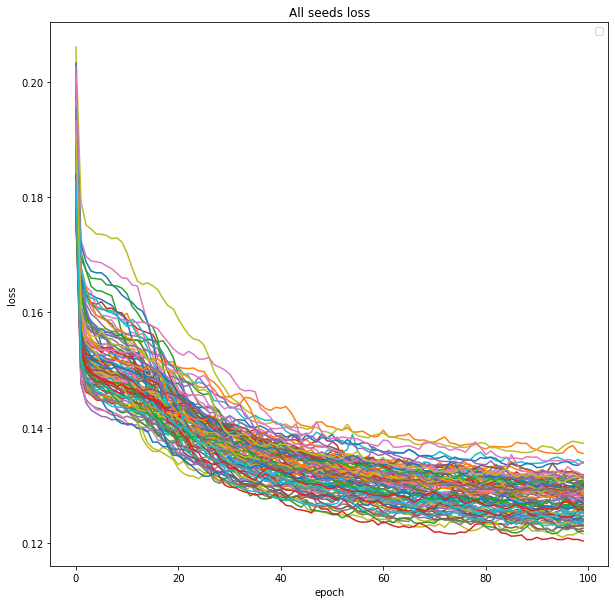

In [ ]:
print("training loss")
plot_seeds(train_loss_1)

Mean Training Loss


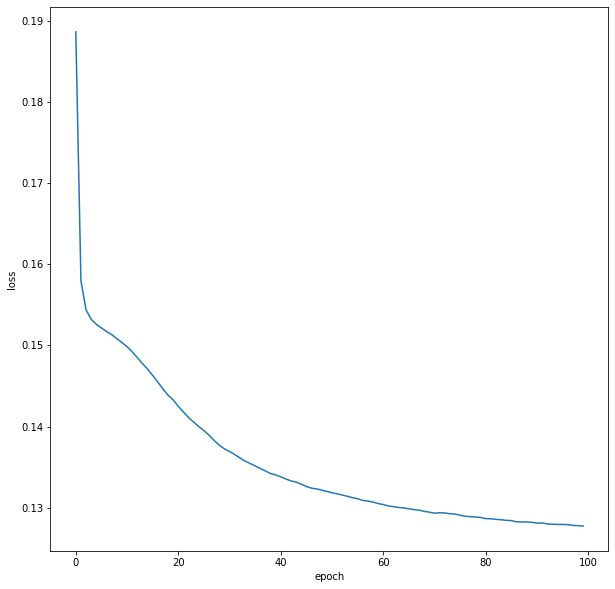

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_1_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


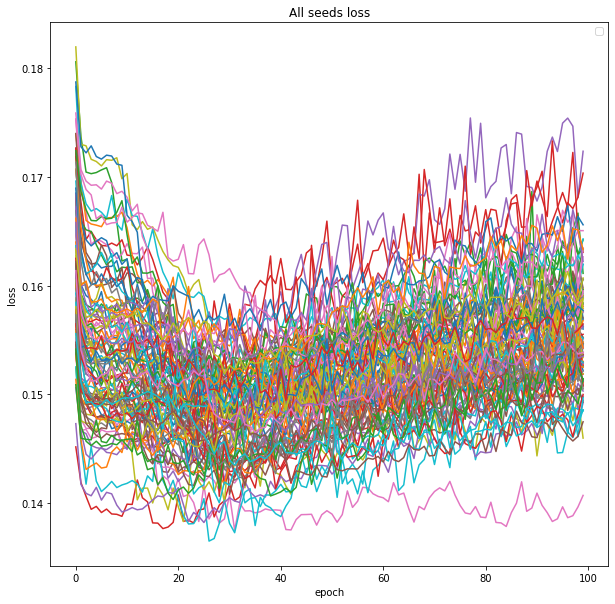

In [ ]:
print("testing loss")
plot_seeds(test_loss_1)

Mean Test Loss


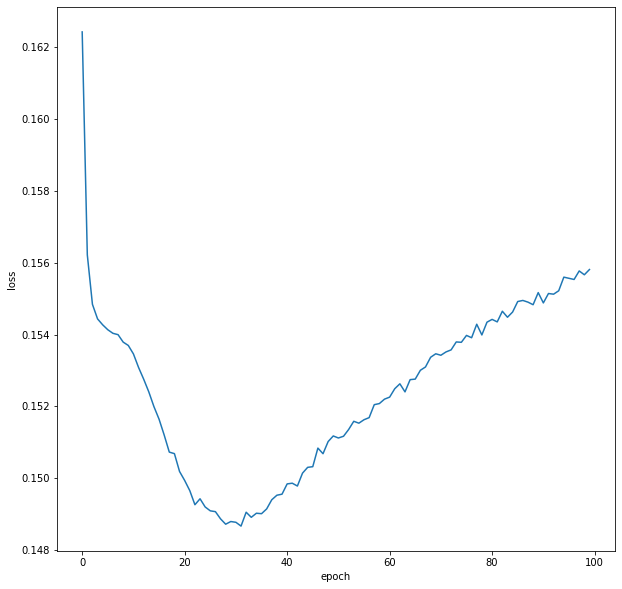

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_1_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 2

It is made of 4 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_2_training = simulation_processing(train_loss_2)
model_2_testing = simulation_processing(test_loss_2)

In [ ]:
model_2_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.188400,0.198981,0.192255,0.206347,0.207562,0.194213,0.185587,0.184664,0.194815,0.187465,...,0.196101,0.198440,0.195836,0.183200,0.191381,0.192932,0.174684,0.210864,0.192820,0.007750
1,0.156084,0.165953,0.169290,0.163766,0.172949,0.157677,0.151004,0.159366,0.166053,0.156674,...,0.164940,0.170856,0.162997,0.151039,0.163793,0.164155,0.146100,0.178870,0.161910,0.007555
2,0.152731,0.162631,0.167936,0.159990,0.168864,0.155962,0.147657,0.155350,0.163905,0.153857,...,0.162472,0.167667,0.159190,0.147862,0.161197,0.160101,0.143087,0.176319,0.158999,0.007599
3,0.151478,0.160785,0.166874,0.159032,0.168688,0.154498,0.147074,0.154585,0.163674,0.153135,...,0.161783,0.166969,0.157682,0.146759,0.160166,0.158518,0.142470,0.175964,0.158143,0.007568
4,0.150858,0.160596,0.165809,0.158612,0.168411,0.153583,0.146387,0.153841,0.163494,0.153044,...,0.161729,0.165736,0.157066,0.146239,0.159812,0.158079,0.142037,0.175443,0.157722,0.007537
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.128408,0.131897,0.127588,0.130503,0.133121,0.122734,0.125337,0.123764,0.129427,0.126755,...,0.134344,0.127547,0.128447,0.123463,0.130033,0.120247,0.120238,0.135069,0.127973,0.003221
96,0.128148,0.132242,0.127049,0.129983,0.132932,0.122615,0.125193,0.123532,0.130001,0.126913,...,0.134505,0.127865,0.128437,0.124004,0.131341,0.120140,0.119987,0.135222,0.127899,0.003304
97,0.127742,0.131475,0.126437,0.130186,0.133157,0.123525,0.125413,0.124026,0.129882,0.126210,...,0.135117,0.127796,0.127872,0.123106,0.130651,0.120396,0.120232,0.135365,0.127863,0.003278
98,0.127858,0.132027,0.127330,0.130070,0.133223,0.124241,0.125042,0.123305,0.129406,0.125966,...,0.134193,0.127143,0.127870,0.123315,0.130400,0.120807,0.119701,0.135589,0.127783,0.003292


In [ ]:
model_2_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.162757,0.168045,0.175190,0.172633,0.180845,0.169727,0.154846,0.162618,0.167308,0.167836,...,0.168074,0.171367,0.163343,0.158332,0.164656,0.167565,0.149057,0.185064,0.165550,0.007897
1,0.157445,0.164973,0.171005,0.161928,0.175347,0.163079,0.152249,0.159303,0.163479,0.160446,...,0.163364,0.167087,0.158197,0.151855,0.160406,0.161515,0.143463,0.180939,0.160641,0.008039
2,0.153653,0.161249,0.172950,0.161362,0.173064,0.162616,0.151158,0.158269,0.162873,0.159709,...,0.162229,0.164435,0.155088,0.149624,0.159091,0.161281,0.142587,0.179409,0.159521,0.007976
3,0.154100,0.161150,0.169027,0.161320,0.173152,0.162644,0.150249,0.157179,0.162541,0.159468,...,0.161717,0.165234,0.155890,0.148896,0.159224,0.159811,0.142541,0.179415,0.159272,0.007934
4,0.153762,0.161066,0.169066,0.162228,0.172880,0.161616,0.150903,0.157149,0.162051,0.160994,...,0.161883,0.163118,0.155062,0.149275,0.159303,0.159992,0.142656,0.179662,0.159109,0.007839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.159736,0.156483,0.160875,0.162507,0.157486,0.158377,0.155838,0.151297,0.154172,0.155206,...,0.153511,0.145946,0.158108,0.149487,0.158603,0.151134,0.141372,0.164766,0.153256,0.004568
96,0.155921,0.154513,0.158860,0.164587,0.157630,0.158889,0.155600,0.154216,0.153460,0.155923,...,0.153089,0.144605,0.157538,0.149830,0.158833,0.152431,0.142077,0.164587,0.153553,0.004461
97,0.157092,0.156747,0.161916,0.164446,0.156522,0.160219,0.156265,0.154515,0.155073,0.158370,...,0.151976,0.146519,0.158129,0.151187,0.160174,0.151195,0.143483,0.164446,0.153629,0.004552
98,0.157869,0.153079,0.155583,0.164789,0.157235,0.159727,0.152943,0.151155,0.155471,0.156933,...,0.153416,0.145331,0.156268,0.148731,0.159385,0.149778,0.141506,0.164789,0.153501,0.004815


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_2

[0.0451259730053956,
 0.04095695853503874,
 0.04450675273324898,
 0.04697507717004171,
 0.042324897708297435,
 0.04393722440795079,
 0.04220275561415351,
 0.04102807029154778,
 0.04214727574968584,
 0.04348707670592528,
 0.04469343391440698,
 0.04354034806862218,
 0.039455638824097174,
 0.03911210801069621,
 0.037607807757502554,
 0.03781630069147778,
 0.03656136993318738,
 0.03930659279744677,
 0.04151297713239939,
 0.04301103453619683,
 0.04227340149539795,
 0.03879667862723843,
 0.042413481851886085,
 0.036040729858969826,
 0.04331051082121851,
 0.04162432280234619,
 0.04190265568077947,
 0.04048141179052529,
 0.04000150154098253,
 0.039610535214039386,
 0.039972097038865166,
 0.04004709815141195,
 0.04278282860588261,
 0.041580985913014804,
 0.04130588739204424,
 0.04049607321373803,
 0.041544418964400094,
 0.039894853591210915,
 0.04391090093543645,
 0.03651983915018894,
 0.04058843664789387,
 0.04247293350719649,
 0.03929619652451132,
 0.040926455154495944,
 0.03875708923147607,


## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


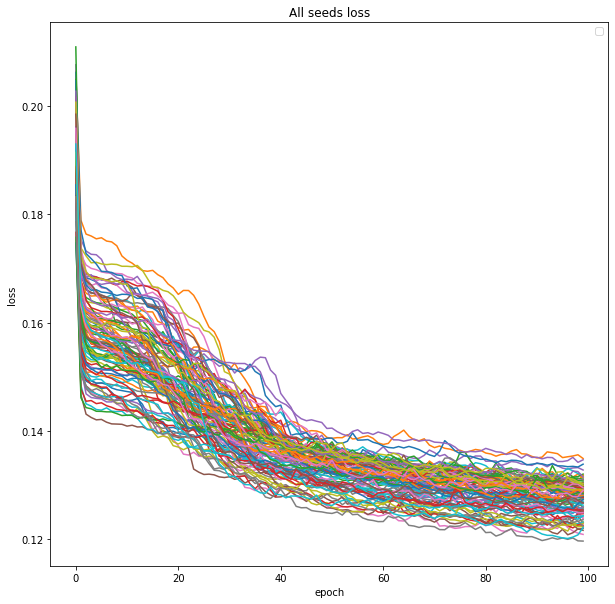

In [ ]:
print("training loss")
plot_seeds(train_loss_2)

Mean Training Loss


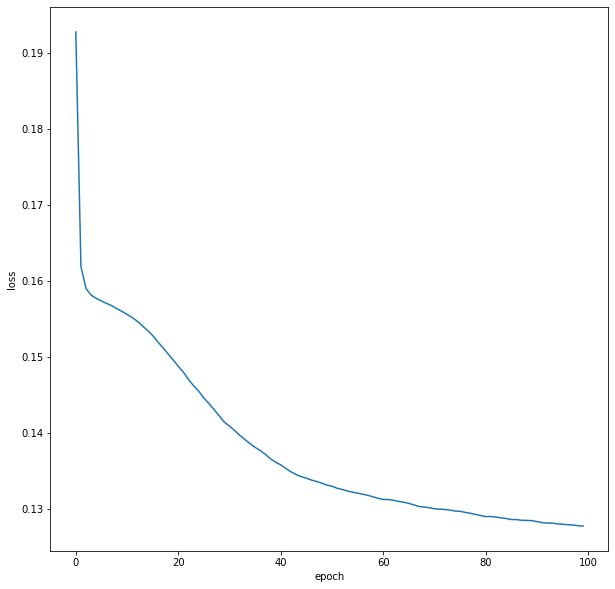

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_2_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


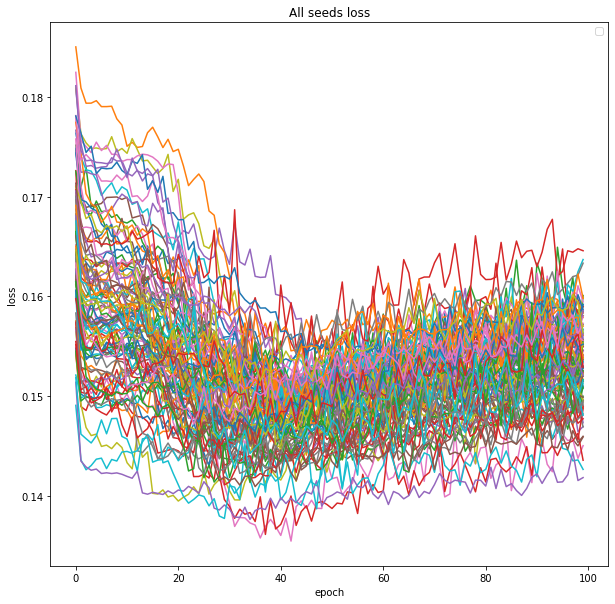

In [ ]:
print("testing loss")
plot_seeds(test_loss_2)

Mean Test Loss


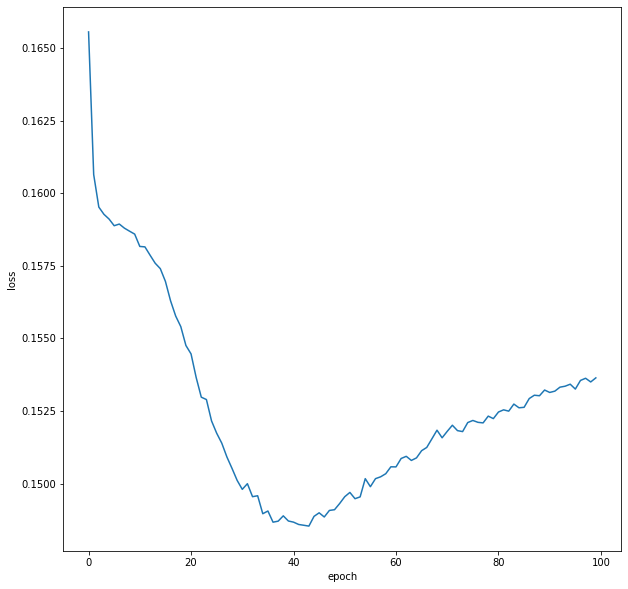

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_2_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 3

It is made of 5 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 25 neural with ReLU Activation
* Layer4 : 50 neural with ReLU Activation
* Layer5 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_3_training = simulation_processing(train_loss_3)
model_3_testing = simulation_processing(test_loss_3)

In [ ]:
model_3_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.187079,0.207225,0.175648,0.195288,0.191891,0.186857,0.204119,0.196485,0.198867,0.193896,...,0.210231,0.202453,0.191837,0.191223,0.214904,0.191750,0.166518,0.217586,0.193920,0.010024
1,0.163365,0.175136,0.153553,0.163520,0.155701,0.155146,0.167001,0.160820,0.174748,0.163999,...,0.172421,0.180588,0.167422,0.164704,0.179992,0.165451,0.143431,0.182963,0.165834,0.008773
2,0.162426,0.171895,0.152170,0.160606,0.151865,0.152909,0.164362,0.156330,0.172791,0.159295,...,0.168516,0.179259,0.166310,0.162419,0.178128,0.162381,0.142043,0.181144,0.163369,0.008676
3,0.162250,0.171048,0.151676,0.160183,0.150906,0.152627,0.163294,0.154848,0.172556,0.158423,...,0.168099,0.178835,0.165880,0.162016,0.177389,0.161845,0.141816,0.180946,0.162663,0.008655
4,0.161775,0.170706,0.151543,0.160192,0.150479,0.152376,0.163033,0.154760,0.172330,0.157939,...,0.168422,0.178412,0.165289,0.162312,0.176930,0.161421,0.141511,0.181085,0.162315,0.008693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.127483,0.134646,0.126635,0.136633,0.130726,0.131174,0.132858,0.126821,0.137962,0.127736,...,0.131202,0.130463,0.133214,0.127079,0.131968,0.123676,0.122039,0.137962,0.130129,0.003407
96,0.127812,0.134334,0.126543,0.136410,0.130841,0.131342,0.132071,0.126938,0.137271,0.127771,...,0.131606,0.130131,0.132369,0.127174,0.132954,0.123750,0.121790,0.137887,0.130042,0.003374
97,0.127562,0.134684,0.126277,0.137112,0.130474,0.131310,0.131477,0.128545,0.137514,0.127182,...,0.131533,0.129741,0.131688,0.126900,0.131886,0.123524,0.121704,0.137514,0.129979,0.003414
98,0.127149,0.134789,0.126505,0.136884,0.130393,0.132154,0.131110,0.128380,0.137218,0.127023,...,0.130744,0.129748,0.131413,0.126788,0.130998,0.123700,0.121420,0.137218,0.129898,0.003374


In [ ]:
model_3_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.166593,0.180650,0.159062,0.168376,0.165631,0.166616,0.174743,0.167860,0.173406,0.173089,...,0.175088,0.180325,0.165953,0.170328,0.182254,0.170289,0.145876,0.193173,0.169375,0.010169
1,0.164636,0.172130,0.156591,0.163083,0.155973,0.160708,0.171337,0.160207,0.171262,0.166176,...,0.167936,0.178367,0.163145,0.166601,0.177870,0.166551,0.143842,0.187480,0.164847,0.009943
2,0.165157,0.172306,0.156235,0.161892,0.155178,0.160135,0.169344,0.156936,0.170723,0.164418,...,0.166543,0.178227,0.162856,0.166219,0.178116,0.166045,0.144780,0.184924,0.163856,0.009623
3,0.163987,0.171908,0.156039,0.162567,0.154488,0.159661,0.169261,0.156573,0.170375,0.164365,...,0.166949,0.177911,0.162480,0.165541,0.177163,0.164618,0.144079,0.184757,0.163742,0.009609
4,0.166304,0.171492,0.156144,0.162451,0.156075,0.160797,0.169311,0.156689,0.171136,0.164495,...,0.166876,0.178532,0.162774,0.166506,0.176914,0.164499,0.143509,0.184575,0.163642,0.009566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.153310,0.151551,0.153603,0.157646,0.158076,0.151382,0.147988,0.149033,0.153941,0.157536,...,0.153870,0.144301,0.151753,0.149238,0.153179,0.151724,0.141787,0.166936,0.151635,0.004663
96,0.153877,0.150812,0.151140,0.158186,0.158575,0.151156,0.149049,0.147489,0.152701,0.158675,...,0.152486,0.145767,0.153778,0.148107,0.153704,0.150912,0.141670,0.168730,0.151536,0.004898
97,0.153601,0.151263,0.152427,0.155799,0.160118,0.149496,0.149442,0.149671,0.155948,0.157950,...,0.153360,0.146804,0.153378,0.149811,0.152878,0.153815,0.141634,0.165524,0.151740,0.004715
98,0.153921,0.149792,0.153316,0.156513,0.158751,0.149646,0.151567,0.147101,0.154467,0.155538,...,0.153475,0.146618,0.154523,0.146971,0.153065,0.151743,0.142382,0.169836,0.151660,0.004902


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_3

[0.04222829497906964,
 0.039233170691889,
 0.04077822735175021,
 0.0425704186565469,
 0.04279640696547427,
 0.03977302694493559,
 0.03885593354889344,
 0.038648189606544786,
 0.04192119347272825,
 0.04296011554880787,
 0.039495709085172484,
 0.04391098449906802,
 0.03761494146139709,
 0.03933250818860376,
 0.038982854881028525,
 0.03997108981560202,
 0.03834866626274586,
 0.038882253744953736,
 0.04115824432345165,
 0.04348767743526184,
 0.04041869735986424,
 0.03924990783826988,
 0.040595346450977336,
 0.036101730337049366,
 0.04207116853626193,
 0.04203627025913639,
 0.03896199951892022,
 0.041133264751519454,
 0.03622312929198354,
 0.04107536997319633,
 0.0403256915111946,
 0.03888536357257644,
 0.042692781215142084,
 0.039932916871621094,
 0.039175245892708405,
 0.04062425058331865,
 0.04055046236672687,
 0.039547783176420624,
 0.041439514234986,
 0.03784727932582354,
 0.041248153764393704,
 0.041138894521266865,
 0.03838453648058597,
 0.0405071117244293,
 0.039876891392537715,
 0.

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


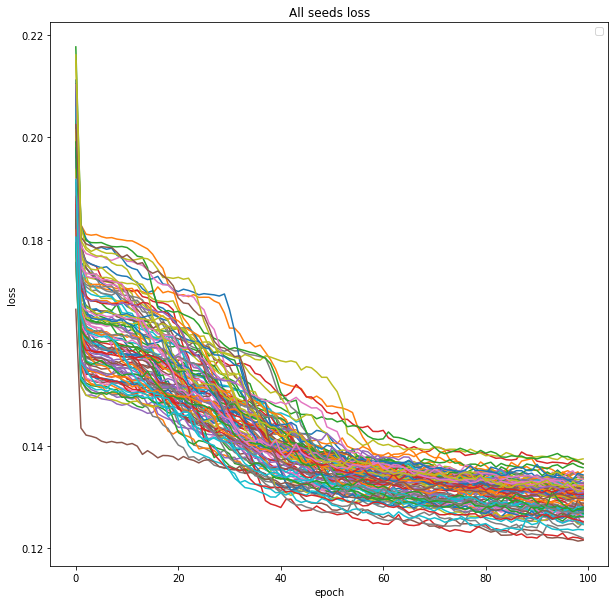

In [ ]:
print("training loss")
plot_seeds(train_loss_3)

Mean Training Loss


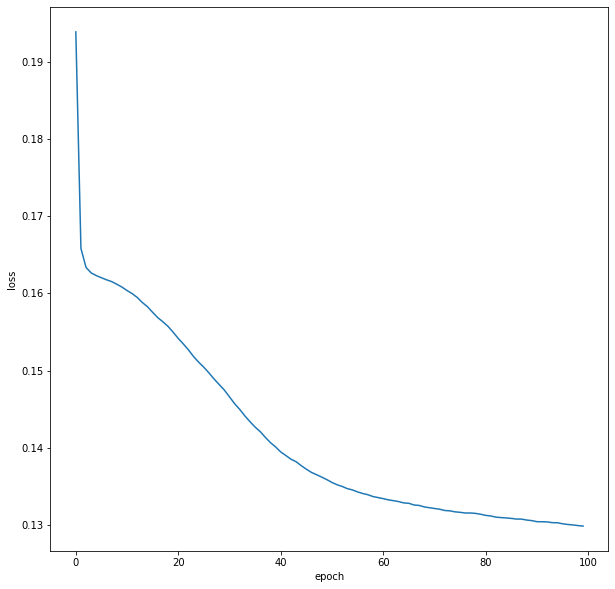

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_3_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


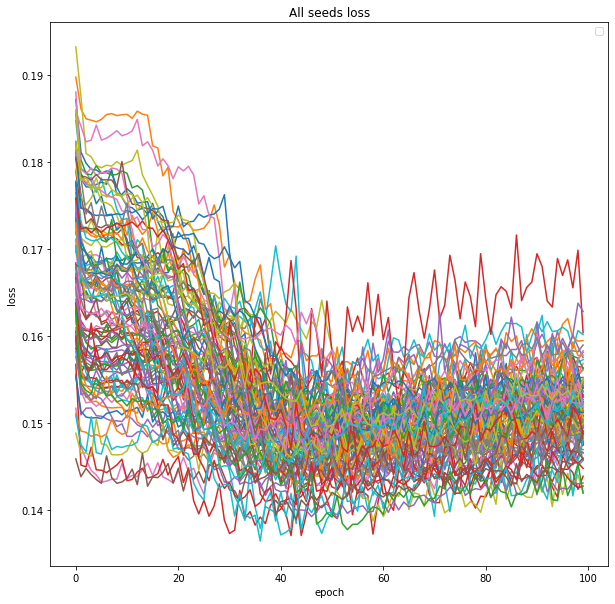

In [ ]:
print("testing loss")
plot_seeds(test_loss_3)

Mean Test Loss


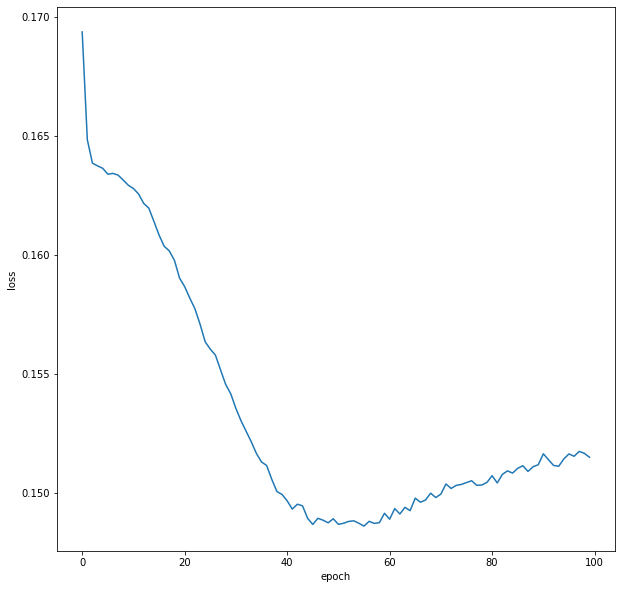

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_3_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 4

It is made of 6 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 25 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 50 neural with ReLU Activation
* Layer6 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_4_training = simulation_processing(train_loss_4)
model_4_testing = simulation_processing(test_loss_4)

In [ ]:
model_4_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.195504,0.184201,0.209297,0.205465,0.186231,0.191810,0.186838,0.174751,0.196189,0.195964,...,0.208815,0.200535,0.208925,0.194484,0.195914,0.197036,0.174751,0.220624,0.194927,0.009378
1,0.164174,0.157391,0.175342,0.184202,0.161803,0.164063,0.167690,0.154968,0.176609,0.171755,...,0.184418,0.174188,0.183513,0.174424,0.168915,0.167401,0.151834,0.188217,0.169611,0.008940
2,0.161200,0.155966,0.173176,0.182890,0.160567,0.160898,0.165185,0.152896,0.174608,0.169404,...,0.182856,0.167782,0.182090,0.172871,0.167797,0.165284,0.150498,0.186299,0.167396,0.008936
3,0.160494,0.155688,0.172589,0.182609,0.160293,0.159805,0.164378,0.152724,0.173913,0.167896,...,0.182347,0.166761,0.182088,0.173173,0.167604,0.165095,0.149485,0.184809,0.166783,0.008909
4,0.160373,0.154434,0.172367,0.182381,0.159857,0.158345,0.164869,0.152481,0.173640,0.167773,...,0.182436,0.165140,0.181565,0.172457,0.167745,0.164999,0.149262,0.183193,0.166445,0.008893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.132415,0.134500,0.129254,0.137166,0.133657,0.129817,0.128916,0.132727,0.133445,0.131180,...,0.135809,0.132843,0.137875,0.130279,0.135998,0.128978,0.124594,0.142215,0.132437,0.003345
96,0.132664,0.134750,0.129070,0.137249,0.134244,0.129332,0.128728,0.132791,0.133224,0.131259,...,0.135644,0.132431,0.136199,0.130657,0.135486,0.128564,0.124180,0.142610,0.132318,0.003368
97,0.133712,0.133781,0.129108,0.137149,0.134532,0.129568,0.128652,0.132174,0.133593,0.130544,...,0.135235,0.132623,0.135520,0.130554,0.135664,0.128227,0.124078,0.142364,0.132251,0.003386
98,0.133679,0.133368,0.129133,0.136571,0.134039,0.129458,0.128448,0.131957,0.133121,0.130455,...,0.135520,0.133177,0.135126,0.130525,0.135983,0.128589,0.124273,0.142318,0.132248,0.003358


In [ ]:
model_4_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.169125,0.158437,0.183846,0.186209,0.167063,0.174694,0.174805,0.162099,0.177436,0.183173,...,0.185461,0.175610,0.180993,0.178137,0.169884,0.171103,0.148520,0.193944,0.172867,0.009834
1,0.164766,0.156125,0.176588,0.183929,0.164633,0.170899,0.170351,0.156133,0.173633,0.177798,...,0.182794,0.168429,0.178768,0.174958,0.168052,0.166472,0.145598,0.187136,0.168849,0.009452
2,0.163423,0.156650,0.176756,0.183288,0.164563,0.168796,0.170107,0.156698,0.173458,0.176846,...,0.180583,0.164668,0.178097,0.175923,0.167990,0.166086,0.144619,0.185656,0.167963,0.009352
3,0.163468,0.154729,0.176066,0.183517,0.164035,0.167258,0.170661,0.156438,0.172941,0.175465,...,0.180332,0.164176,0.178884,0.175194,0.167468,0.165945,0.144443,0.184651,0.167700,0.009191
4,0.163156,0.153955,0.176156,0.183182,0.164859,0.165726,0.170541,0.156436,0.173288,0.175735,...,0.181219,0.163816,0.177145,0.174589,0.167848,0.165999,0.144085,0.184479,0.167555,0.009249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.153324,0.152545,0.151489,0.155611,0.157320,0.152122,0.152013,0.143560,0.151123,0.155288,...,0.154366,0.142427,0.148925,0.145280,0.157034,0.145093,0.138723,0.164855,0.149793,0.004536
96,0.154689,0.153443,0.152715,0.154404,0.157946,0.152522,0.151471,0.144621,0.153313,0.157708,...,0.155028,0.144058,0.151111,0.146341,0.158567,0.144915,0.138316,0.161203,0.149904,0.004536
97,0.152337,0.152625,0.152505,0.155491,0.155258,0.153068,0.151140,0.144804,0.152536,0.154220,...,0.156901,0.143894,0.151976,0.143397,0.160054,0.144811,0.139523,0.164607,0.150136,0.004730
98,0.152023,0.152435,0.151819,0.155798,0.156737,0.154455,0.152231,0.144381,0.150851,0.156754,...,0.153471,0.143267,0.151842,0.143843,0.156692,0.144939,0.137545,0.160804,0.149862,0.004547


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_4

[0.04155102344985773,
 0.03979868049333625,
 0.04006724255609424,
 0.041390598033372326,
 0.04115501475918798,
 0.04188272109995954,
 0.03995339125008567,
 0.03828881244962196,
 0.03894261367145163,
 0.041553444700900256,
 0.04085283614405617,
 0.041241439064481605,
 0.03948538278754718,
 0.037417174305972474,
 0.03983212681819779,
 0.038334781836628064,
 0.03729125651622589,
 0.0387024796962079,
 0.04033965971084827,
 0.04100330883675787,
 0.04144927472787832,
 0.04011464358212642,
 0.039446955531973374,
 0.035205409211070404,
 0.03764929500236459,
 0.04045822600378564,
 0.036199287453126026,
 0.040839978218409706,
 0.03653138563896364,
 0.038280335149162584,
 0.03841104692875759,
 0.04034655101762859,
 0.04215861922094876,
 0.03735313510920079,
 0.040087873903579166,
 0.03871357932677537,
 0.03790879412807633,
 0.037508125649903044,
 0.04153453992583929,
 0.034773239091308576,
 0.0397191290634948,
 0.039886472868419655,
 0.037854941597321,
 0.041139103019372764,
 0.03709030105825711,

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


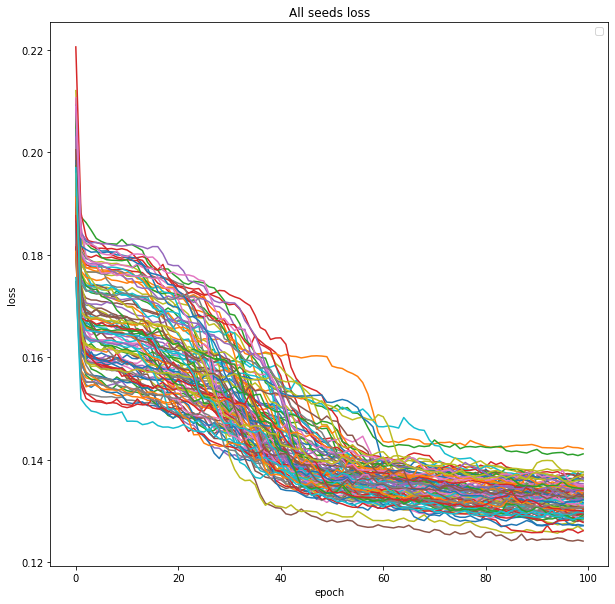

In [ ]:
print("training loss")
plot_seeds(train_loss_4)

Mean Training Loss


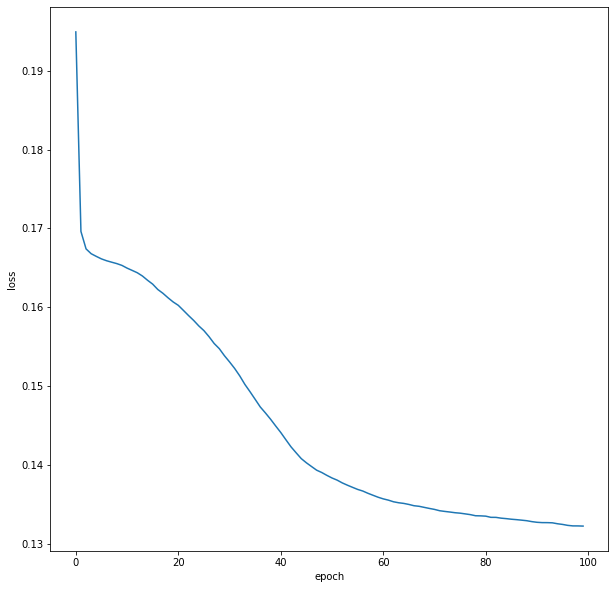

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_4_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


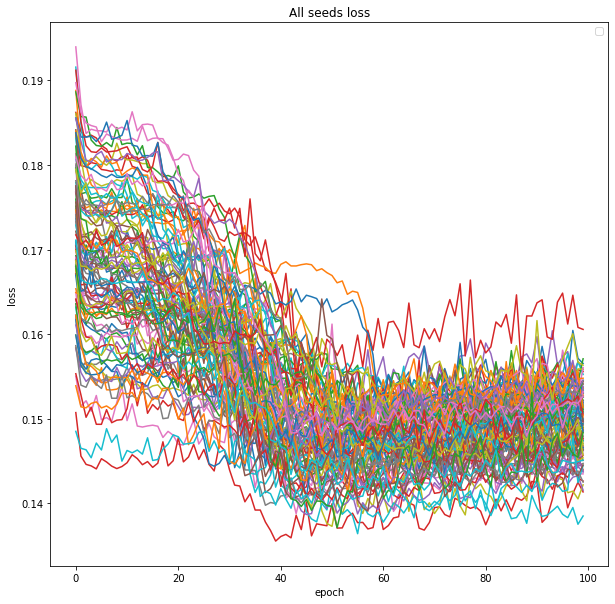

In [ ]:
print("testing loss")
plot_seeds(test_loss_4)

Mean Test Loss


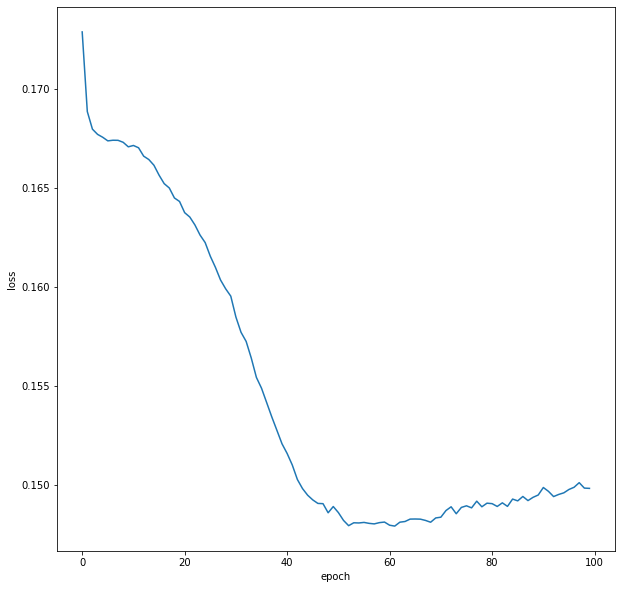

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_4_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 5

It is made of 7 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 75 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 50 neural with ReLU Activation
* Layer6 : 75 neural with ReLU Activation
* Layer7 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_5_training = simulation_processing(train_loss_5)
model_5_testing = simulation_processing(test_loss_5)

In [ ]:
model_5_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.193537,0.203735,0.184151,0.196994,0.189162,0.186055,0.204758,0.196711,0.203652,0.194694,...,0.205583,0.191420,0.197018,0.187148,0.219920,0.207890,0.176577,0.225449,0.199453,0.011042
1,0.163507,0.180143,0.159058,0.162871,0.159887,0.166162,0.166834,0.157944,0.164356,0.164570,...,0.174070,0.163116,0.169982,0.159638,0.193046,0.169311,0.150229,0.193046,0.169222,0.008792
2,0.161773,0.178930,0.157814,0.160884,0.158434,0.165595,0.163852,0.156802,0.162186,0.163277,...,0.171092,0.160602,0.169082,0.158521,0.190017,0.163914,0.149620,0.190088,0.166951,0.008542
3,0.161052,0.178747,0.157170,0.160789,0.157605,0.164621,0.163485,0.156055,0.161732,0.162061,...,0.170505,0.159678,0.170119,0.158106,0.189558,0.162650,0.148359,0.189903,0.166326,0.008578
4,0.161484,0.178824,0.157852,0.160848,0.158066,0.162957,0.163840,0.156418,0.161045,0.162282,...,0.168959,0.159618,0.169599,0.157914,0.189350,0.162244,0.147372,0.189420,0.166030,0.008527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.137685,0.137871,0.136015,0.143230,0.136462,0.131061,0.134923,0.132683,0.139516,0.134409,...,0.141218,0.133573,0.144420,0.131585,0.142986,0.129958,0.126768,0.144420,0.135847,0.003745
96,0.138574,0.137601,0.134518,0.142939,0.136171,0.130814,0.134623,0.132761,0.138776,0.134872,...,0.140705,0.134013,0.144772,0.131872,0.142667,0.129584,0.126882,0.144772,0.135800,0.003741
97,0.137974,0.136936,0.134542,0.143014,0.135746,0.130658,0.134477,0.132949,0.138109,0.133057,...,0.140699,0.133781,0.144350,0.131224,0.143890,0.129529,0.126867,0.144350,0.135665,0.003725
98,0.137290,0.136941,0.134750,0.143837,0.135899,0.130920,0.134704,0.132637,0.137833,0.132338,...,0.140387,0.133658,0.144043,0.130982,0.142712,0.129527,0.127140,0.144043,0.135565,0.003717


In [ ]:
model_5_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.167088,0.181553,0.164313,0.165438,0.167604,0.173651,0.175207,0.164264,0.165778,0.176052,...,0.176520,0.164118,0.167769,0.163660,0.197060,0.173908,0.153332,0.197962,0.172393,0.009151
1,0.163801,0.179265,0.160370,0.162926,0.163817,0.171404,0.168679,0.160666,0.161039,0.172162,...,0.170878,0.160210,0.165815,0.160951,0.191370,0.168056,0.152055,0.194826,0.168243,0.008881
2,0.164081,0.178702,0.159949,0.161420,0.161660,0.172079,0.167266,0.158895,0.160652,0.169946,...,0.170175,0.158382,0.165167,0.161680,0.190083,0.165238,0.150352,0.193025,0.167246,0.008898
3,0.163314,0.179407,0.160522,0.161676,0.164195,0.171009,0.167336,0.158900,0.161047,0.171675,...,0.168533,0.157947,0.166171,0.160378,0.190419,0.164693,0.150063,0.193228,0.166996,0.008887
4,0.163907,0.179348,0.159868,0.162582,0.165337,0.167655,0.167209,0.158835,0.159488,0.170193,...,0.168033,0.158013,0.165135,0.161004,0.190821,0.164567,0.150102,0.194351,0.166994,0.008956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.147658,0.150801,0.155098,0.152018,0.156167,0.153034,0.144647,0.147752,0.143350,0.152952,...,0.149487,0.143721,0.145942,0.143367,0.148106,0.145287,0.136695,0.158155,0.147148,0.004564
96,0.147819,0.148585,0.152202,0.152547,0.156128,0.152949,0.145839,0.147634,0.143390,0.151823,...,0.148585,0.145990,0.146106,0.143740,0.149470,0.145103,0.136396,0.158338,0.147214,0.004365
97,0.147019,0.148550,0.150834,0.153003,0.157026,0.153945,0.146523,0.145506,0.146442,0.149109,...,0.148755,0.143476,0.145331,0.145250,0.147672,0.145597,0.137670,0.158824,0.147230,0.004394
98,0.147289,0.148324,0.150982,0.152572,0.156498,0.153838,0.144602,0.145987,0.144629,0.152587,...,0.148787,0.144796,0.145705,0.144928,0.149106,0.143638,0.136690,0.158764,0.147450,0.004423


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_5

[0.038668890871382866,
 0.03877147451530979,
 0.04099667975243998,
 0.03972343294682097,
 0.042559294403216145,
 0.04072859976313769,
 0.037180737764512514,
 0.038495586150477185,
 0.03731577908000487,
 0.04003195476552426,
 0.03851132606542717,
 0.044640480713666435,
 0.037048007095549035,
 0.03763263377410945,
 0.03634984476018331,
 0.037492261477346654,
 0.034644817947150755,
 0.03747929898866265,
 0.03866222689774137,
 0.04142315272138932,
 0.03862989019851577,
 0.03823061579278471,
 0.038105880315896984,
 0.03305506252272569,
 0.03559324126691634,
 0.04033579966603438,
 0.037660459381053356,
 0.03809007573419323,
 0.03533746974808921,
 0.037251503305662556,
 0.036646784736357026,
 0.03680154794836111,
 0.03989388386110536,
 0.03525362258364537,
 0.039317476991450655,
 0.039458700321255626,
 0.03801153930307335,
 0.03652099893625994,
 0.03964392296808361,
 0.03418775713140564,
 0.03858742187940014,
 0.040104953809785016,
 0.035415620168927936,
 0.03931889972782707,
 0.0361901650730

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


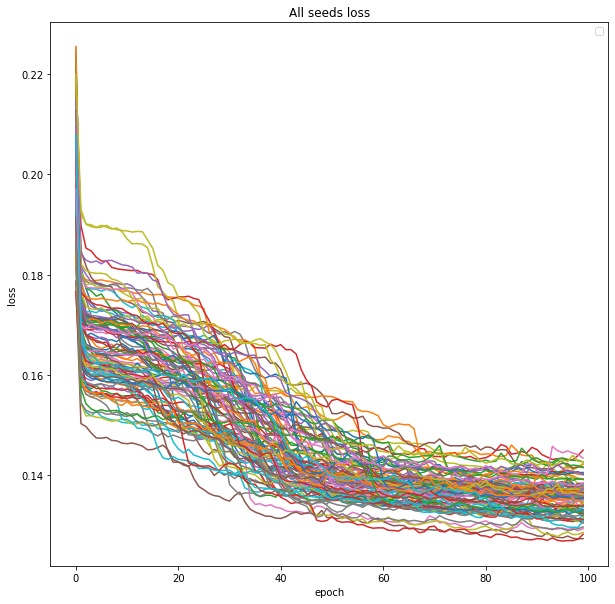

In [ ]:
print("training loss")
plot_seeds(train_loss_5)

Mean Training Loss


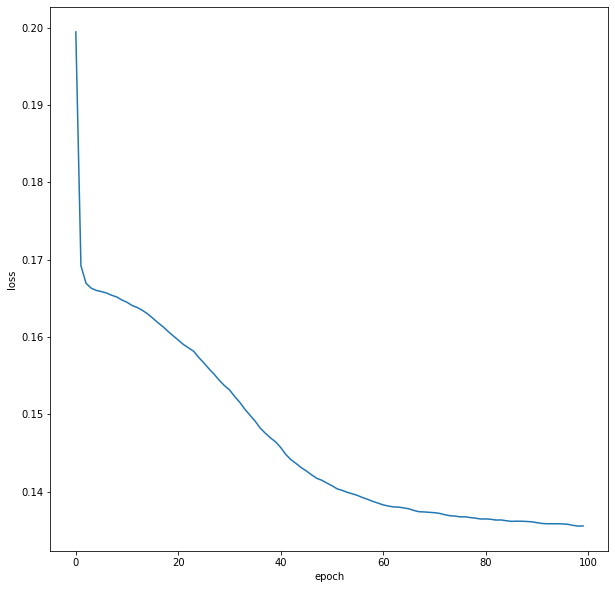

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_5_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


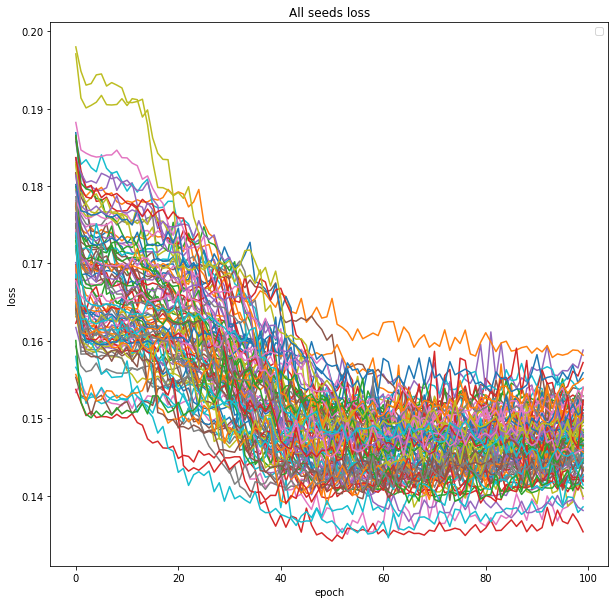

In [ ]:
print("testing loss")
plot_seeds(test_loss_5)

Mean Test Loss


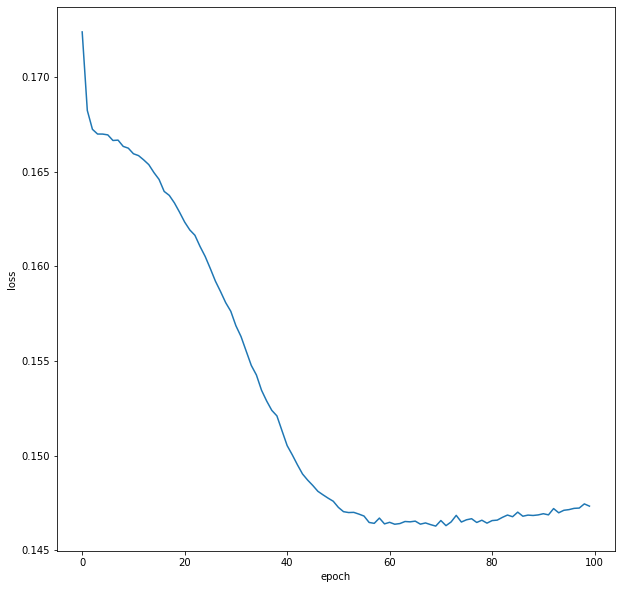

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_5_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 6

It is made of 8 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 75 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 25 neural with ReLU Activation
* Layer6 : 50 neural with ReLU Activation
* Layer7 : 75 neural with ReLU Activation
* Layer8 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_6_training = simulation_processing(train_loss_6)
model_6_testing = simulation_processing(test_loss_6)

In [ ]:
model_6_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.203774,0.215016,0.196514,0.230769,0.210285,0.186268,0.177322,0.217313,0.198817,0.187649,...,0.196040,0.194536,0.198564,0.201733,0.202225,0.181793,0.177322,0.230769,0.199628,0.011513
1,0.177207,0.184287,0.174868,0.187735,0.183548,0.165187,0.152420,0.181423,0.166162,0.169224,...,0.172197,0.176492,0.176773,0.168607,0.179102,0.158305,0.152420,0.187735,0.171857,0.008256
2,0.172335,0.181948,0.173419,0.184717,0.181026,0.161177,0.150859,0.176383,0.164398,0.168077,...,0.169795,0.174029,0.175259,0.167465,0.176060,0.155796,0.150859,0.186418,0.169789,0.008235
3,0.171199,0.181673,0.173315,0.183373,0.179660,0.160290,0.150284,0.175060,0.163389,0.167803,...,0.169551,0.173918,0.175036,0.166718,0.175480,0.155397,0.150284,0.185454,0.169180,0.008193
4,0.170867,0.181896,0.173319,0.182396,0.178939,0.159825,0.150192,0.175062,0.163332,0.167769,...,0.169681,0.173731,0.175085,0.166671,0.175401,0.155431,0.150192,0.184696,0.168985,0.008152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.138955,0.138096,0.135205,0.140759,0.138100,0.135909,0.135271,0.132493,0.137161,0.133913,...,0.141065,0.133437,0.141200,0.134854,0.141687,0.131289,0.129507,0.143978,0.136976,0.003239
96,0.137979,0.138229,0.136767,0.140500,0.138940,0.135613,0.136494,0.132606,0.137041,0.134207,...,0.140986,0.133961,0.141096,0.134464,0.141969,0.131377,0.129461,0.143985,0.136951,0.003262
97,0.137874,0.138432,0.136317,0.140685,0.139013,0.135566,0.134726,0.132425,0.136584,0.133847,...,0.140945,0.133783,0.140998,0.134280,0.141686,0.130933,0.129760,0.144303,0.136915,0.003312
98,0.137207,0.138226,0.135253,0.140734,0.138724,0.135373,0.134793,0.133468,0.136578,0.134185,...,0.140663,0.134117,0.140518,0.134372,0.141393,0.130876,0.129692,0.144162,0.136854,0.003266


In [ ]:
model_6_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.180184,0.187876,0.180627,0.197109,0.189956,0.174360,0.157937,0.189449,0.164993,0.175110,...,0.172901,0.176125,0.174475,0.174575,0.180001,0.162210,0.155399,0.197109,0.174733,0.009055
1,0.177575,0.182425,0.177052,0.187498,0.187423,0.168025,0.153754,0.182865,0.162880,0.174343,...,0.169666,0.173205,0.172213,0.170933,0.176621,0.158751,0.151290,0.187879,0.170905,0.008605
2,0.174438,0.181638,0.177406,0.185728,0.187360,0.165796,0.153885,0.179811,0.161332,0.173692,...,0.167798,0.173806,0.172050,0.169888,0.174475,0.158626,0.152018,0.187360,0.169994,0.008576
3,0.174268,0.181886,0.176521,0.183771,0.185770,0.165748,0.153452,0.179405,0.161255,0.174144,...,0.168030,0.172460,0.171625,0.170100,0.174668,0.158102,0.151081,0.187835,0.169821,0.008490
4,0.174264,0.182089,0.177378,0.183468,0.185705,0.164833,0.155252,0.179939,0.160707,0.173564,...,0.168428,0.172803,0.172101,0.170303,0.175765,0.158397,0.152061,0.187417,0.169804,0.008439
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.146760,0.146033,0.150777,0.154628,0.154339,0.149514,0.145695,0.146598,0.145871,0.150689,...,0.147022,0.142348,0.146606,0.143190,0.151998,0.143592,0.134433,0.156698,0.146521,0.004468
96,0.148267,0.146961,0.148251,0.154419,0.154664,0.150563,0.144159,0.146785,0.145965,0.152210,...,0.147485,0.144863,0.147520,0.144098,0.148655,0.144796,0.135239,0.156269,0.146897,0.004455
97,0.146929,0.147463,0.149907,0.153235,0.159127,0.148231,0.145882,0.146906,0.145961,0.153467,...,0.148381,0.143692,0.146760,0.144192,0.148889,0.145930,0.135127,0.159127,0.146776,0.004417
98,0.146127,0.147151,0.150334,0.153668,0.153649,0.150719,0.145374,0.144210,0.144596,0.149430,...,0.147554,0.145602,0.148585,0.143669,0.149625,0.143483,0.134070,0.156341,0.146697,0.004501


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_6

[0.03910815588479985,
 0.037379046535736336,
 0.0394178373941713,
 0.0404335699459946,
 0.04038291516549088,
 0.039140590640980175,
 0.037272987350335664,
 0.037824034848794624,
 0.037702464605520125,
 0.039683666872640674,
 0.03774212282265217,
 0.04009755685214404,
 0.03655394596015971,
 0.03724990564573401,
 0.03697682261245876,
 0.040110930777311725,
 0.03341410720380319,
 0.03681427110554815,
 0.038580874419707714,
 0.04015789129950036,
 0.039121892455175666,
 0.03990593980572076,
 0.038340781413254615,
 0.03324244752215342,
 0.035798812017986854,
 0.04001289640580678,
 0.03801822315143863,
 0.03692641499077911,
 0.035698517075577904,
 0.03744125368443099,
 0.03705100166747167,
 0.03846039812806248,
 0.03871822901127573,
 0.035362636374100934,
 0.038829303717815226,
 0.03971494518027893,
 0.03760225566258953,
 0.03544152209910585,
 0.0391244011420248,
 0.03255022737580413,
 0.040571595302889285,
 0.038682462429984805,
 0.03625786468696105,
 0.03974413160205146,
 0.0369193684750815

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


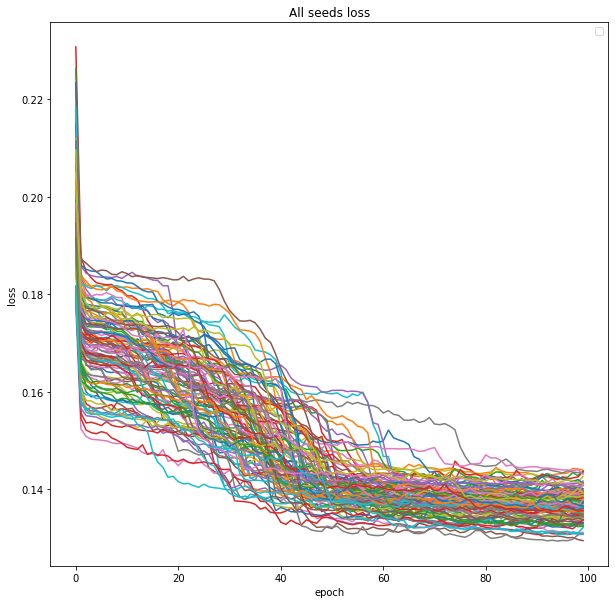

In [ ]:
print("training loss")
plot_seeds(train_loss_6)

Mean Training Loss


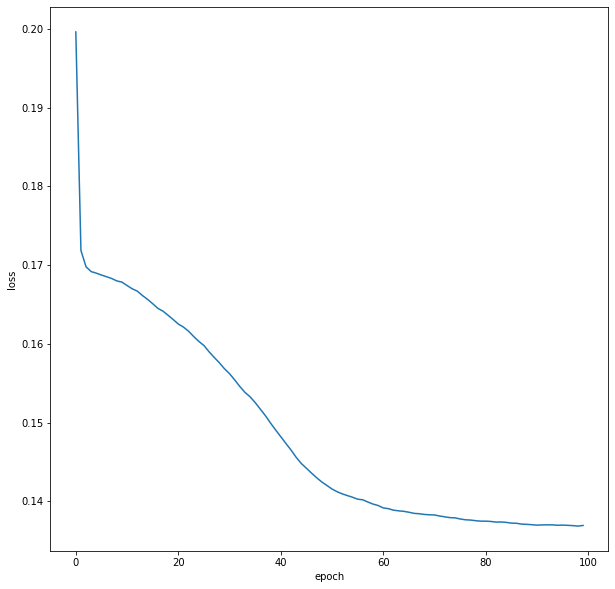

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_6_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


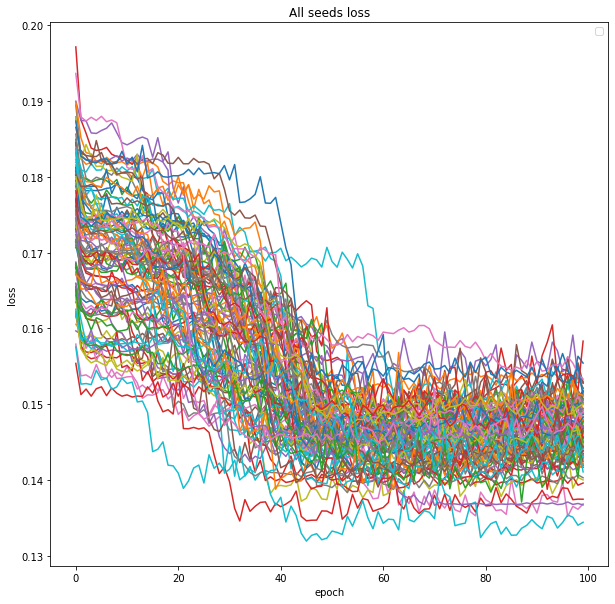

In [ ]:
print("testing loss")
plot_seeds(test_loss_6)

Mean Test Loss


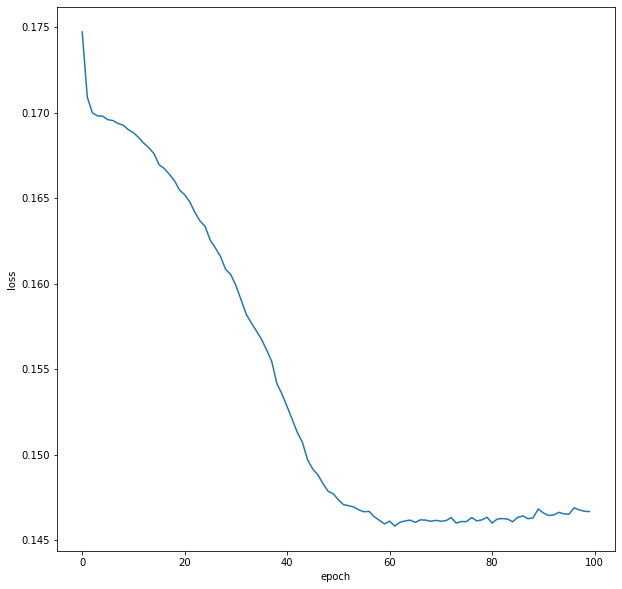

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_6_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Comparative Graph of all model



*   Training loss
*   Testing loss



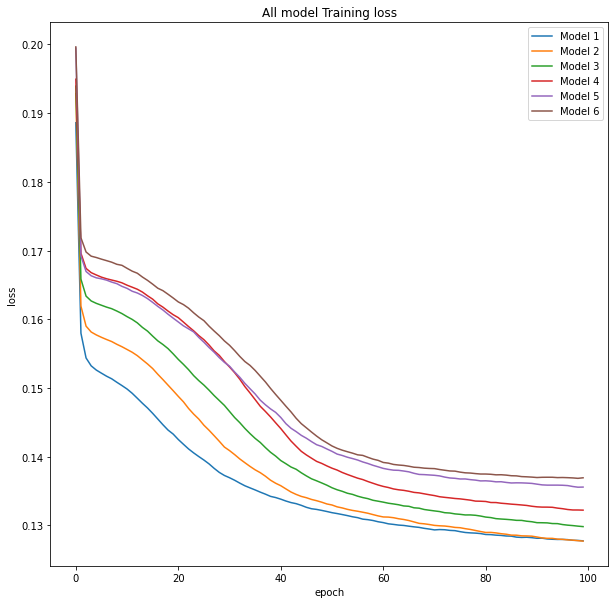

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(model_1_training.loc[:,'mean'], label = "Model 1")
plt.plot(model_2_training.loc[:,'mean'], label = "Model 2")
plt.plot(model_3_training.loc[:,'mean'], label = "Model 3")
plt.plot(model_4_training.loc[:,'mean'], label = "Model 4")
plt.plot(model_5_training.loc[:,'mean'], label = "Model 5")
plt.plot(model_6_training.loc[:,'mean'], label = "Model 6")
plt.title('All model Training loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()

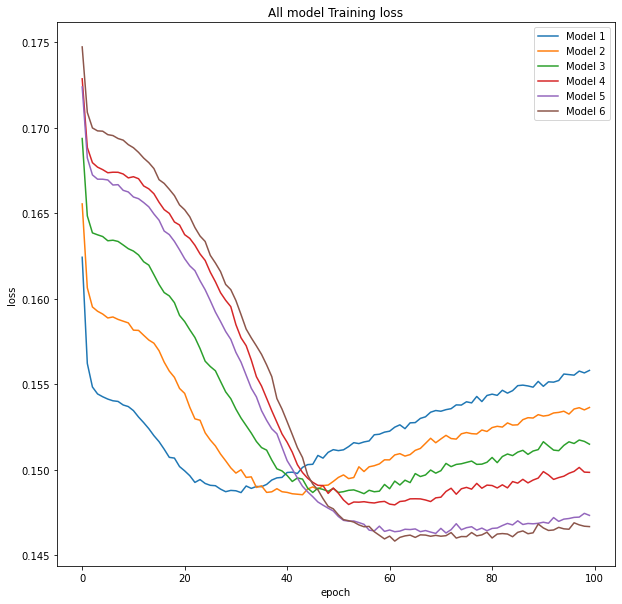

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(model_1_testing.loc[:,'mean'], label = "Model 1")
plt.plot(model_2_testing.loc[:,'mean'], label = "Model 2")
plt.plot(model_3_testing.loc[:,'mean'], label = "Model 3")
plt.plot(model_4_testing.loc[:,'mean'], label = "Model 4")
plt.plot(model_5_testing.loc[:,'mean'], label = "Model 5")
plt.plot(model_6_testing.loc[:,'mean'], label = "Model 6")
plt.title('All model Training loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()